In [1]:
import sys
!{sys.executable} -m pip install gensim
!{sys.executable} -m pip install sklearn
!{sys.executable} -m pip install matplotlib
!{sys.executable} -m pip install pandas
!{sys.executable} -m pip install xgboost
!{sys.executable} -m pip install graphviz

In [2]:
%cd /home/opencog

/home/opencog


In [3]:
from opencog.atomspace import AtomSpace, types
from opencog.scheme_wrapper import scheme_eval
from opencog.type_constructors import *
from opencog.atomspace import get_refreshed_types, get_type, get_type_name

In [4]:
atomspace = AtomSpace()

In [5]:
#deps= "/home/opencog/opencog_deps"
#sample_dataset = "/opt/sample_dataset.scm"
#deps= "opencog_deps"
#sample_dataset = "sample_dataset.scm"

#load the opencog_deps file which has the modules necessary to make the pattern matching functions run
#scheme_eval(atomspace, '(primitive-load "{}")'.format(deps))

# JJJ
scheme_eval(atomspace, "(use-modules (ice-9 readline))")
scheme_eval(atomspace, "(activate-readline)")
scheme_eval(atomspace, "(debug-enable 'backtrace)")
scheme_eval(atomspace, "(read-enable 'positions)")
scheme_eval(atomspace, "(use-modules (opencog))")
scheme_eval(atomspace, "(use-modules (opencog exec))")
scheme_eval(atomspace, "(use-modules (opencog bioscience))")
scheme_eval(atomspace, "(use-modules (rnrs base))")
scheme_eval(atomspace, "(use-modules (rnrs exceptions))")
scheme_eval(atomspace, "(use-modules (ice-9 textual-ports))")
scheme_eval(atomspace, "(use-modules (ice-9 regex))")
scheme_eval(atomspace, "(use-modules (srfi srfi-98))")
scheme_eval(atomspace, "(use-modules (ice-9 match))")
scheme_eval(atomspace, "(use-modules (ice-9 threads))")
scheme_eval(atomspace, "(use-modules (ice-9 ftw))")
scheme_eval(atomspace, "(use-modules (srfi srfi-1))")

b'\n'

In [6]:
scheme_eval(atomspace, '(primitive-load "{}")'.format("kbs/biogrid_gene_gene_3.5.177.scm"))
#scheme_eval(atomspace, '(primitive-load "{}")'.format("smallgene/string_ggi.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("kbs/GO.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("kbs/Go-Plus.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("kbs/GO_annotation.scm"))
#scheme_eval(atomspace, '(primitive-load "{}")'.format("kbs/NCBI2Reactome_PE_Pathway.txt2.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("kbs/NCBI2Reactome_PE_Pathway.txt.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("kbs/reactome.scm"))
scheme_eval(atomspace, '(primitive-load "{}")'.format("kbs/smpdb_gene.scm"))

#verify the atoms are loaded
print("after datasets: " + scheme_eval(atomspace, "(count-all)").decode("utf-8"))

after datasets: 2222880



In [7]:
#specify the default atomspace to use for running queries
set_default_atomspace(atomspace)

In [8]:
#we need to refresh the type dict so that it contains the newly added types [GeneNode, MoleculeNode]
types = get_refreshed_types()

In [9]:
import copy
def find_deepwalk_node_type(node): 
    deepwalk_node_type = None
    node_defs = { 
            #take the first that begins with the string"
            "ConceptNode":[("R-HSA","rhsapathway"), ("SMP","smppathway"), ("GO:","geneontologyterm")],
            "PredicateNode":[("has_location","location")],
            "GeneNode":[("","gene")]
    }
    #print("node.type_name")
    #print(node.type_name)
    if (node.type_name in node_defs):
        prefix_list = copy.deepcopy(node_defs[node.type_name])
        found = False
        while not found and len(prefix_list)> 0:
            prefix_tuple = prefix_list.pop(0)
            #print ("prefix_tuple")
            #print (prefix_tuple)
            if prefix_tuple[0] == "" or node.name.startswith(prefix_tuple[0]):
                found == True
                deepwalk_node_type = prefix_tuple[1]
                
    return deepwalk_node_type

In [10]:
from opencog.bindlink import execute_atom

def construct_eval_set_query(predicate, node, other_type=None):
    '''
    Note: this function is returning the Evalutaion Links instead of the grounded node because 
    the links have the truth values
    '''
    if other_type is None:      
        bind_atom = \
            GetLink(
                VariableNode("$g"),
                EvaluationLink(
                    PredicateNode(predicate),
                    SetLink(
                        node,
                        VariableNode("$g")
                    )
                ), 
                EvaluationLink(
                    PredicateNode(predicate),
                    SetLink(
                        node,
                        VariableNode("$g")
                    )
                )
            )
    else:
        bind_atom = \
            BindLink(
                TypedVariableLink(VariableNode("$g"), TypeNode(other_type)),
                EvaluationLink(
                    PredicateNode(predicate),
                    SetLink(
                        node,
                        VariableNode("$g")
                    )
                ), 
                EvaluationLink(
                    PredicateNode(predicate),
                    SetLink(
                        node,
                        VariableNode("$g")
                    )
                )
            )
        
    result = execute_atom(atomspace, bind_atom)
    #print(result)
    return result.out

In [11]:
from opencog.bindlink import execute_atom

def construct_eval_query(predicate, node, other_type=None):
    if other_type is None:      
        bind_atom = \
            BindLink(
                VariableNode("$g"),
                EvaluationLink(
                    PredicateNode(predicate),
                    ListLink(
                        node,
                        VariableNode("$g")
                    )
                ), 
                VariableNode("$g")
            )
    else:
        bind_atom = \
            BindLink(
                TypedVariableLink(VariableNode("$g"), TypeNode(other_type)),
                EvaluationLink(
                    PredicateNode(predicate),
                    ListLink(
                        node,
                        VariableNode("$g")
                    )
                ), 
                VariableNode("$g")
            )
        
    result = execute_atom(atomspace, bind_atom)
    return result.out

In [12]:
from opencog.bindlink import execute_atom
def construct_member_query(node):
    member_atom = \
        BindLink(VariableNode("$g"),
                 MemberLink(
                    node,
                    VariableNode("$g")
                 ),
                 VariableNode("$g")
        )
    
    result = execute_atom(atomspace, member_atom)
    return result.out

In [13]:
from opencog.bindlink import execute_atom
def construct_inheritance_query(node):
    member_atom = \
        BindLink(VariableNode("$g"),
                 InheritanceLink(
                    node,
                    VariableNode("$g")
                 ),
                 VariableNode("$g")
        )
    result = execute_atom(atomspace, member_atom)
    return result.out

In [14]:
from opencog.bindlink import execute_atom
def construct_subset_query(node):
    member_atom = \
        BindLink(VariableNode("$g"),
                 SubsetLink(
                    node,
                    VariableNode("$g")
                 ),
                 VariableNode("$g")
                )
    result = execute_atom(atomspace, member_atom)
    return result.out

In [15]:
def construct_context_query(gene):
    query_atom = \
        BindLink(
            VariableList(
                TypedVariableLink(VariableNode("$p"), TypeNode("ConceptNode")),
                TypedVariableLink(VariableNode("$q"), TypeNode("ConceptNode"))
            ),
            ContextLink(
                MemberLink(
                    gene,
                    VariableNode ("$p")
                ),
                EvaluationLink(
                     PredicateNode ("has_location"),
                     ListLink(
                        gene,
                        VariableNode ("$q")
                     )
                )
            ),
            ListLink(
                VariableNode("$p"),
                VariableNode("$q")
            )
        )
    result = execute_atom(atomspace, query_atom)
    return result.out

In [16]:
linkset = {"inhibits", "is-inhibited-by", "ptmod", "is-ptmoded-by", "expresses","is-expressed-by", 
           "activates", "is-activated-by", "catalyzes", "is-catalyzed-by", "binds-with", "reacts-with", 
           "in-smp-pathway", "has-smp-pathway-member", "in-gene-ontology",
           "has-gene-ontology-member", 'is-in', 'in-context-of', 'is-context-where', 
           'has', "inherits-pathway", "pathway-inherited-by", 
           "inherits-geneontologyterm", "geneontologyterm-inherited-by", "positively-regulates",
           "is-positively-regulated-by", "negatively-regulates", "is-negatively-regulated-by",
           'has-variant','is-variant-of',"has-person-member", "is-person-member-of", 
           "superc-has-variant", "is-variant-of-superc",
           "normal-has-variant", "is-variant-of-normal"
          }
geneset = set()
rhsapathwayset = set()
smppathwayset = set()
geneontologytermset = set()
locationset = set()

for node in atomspace.get_atoms_by_type(types.Node):
    deepwalk_type = find_deepwalk_node_type(node)

    if deepwalk_type and deepwalk_type == "gene":
        geneset.add(node.name)
    if deepwalk_type and deepwalk_type == "rhsapathway":
        rhsapathwayset.add(node.name)
    if deepwalk_type and deepwalk_type == "smppathway":
        smppathwayset.add(node.name)
    if deepwalk_type and deepwalk_type == "geneontologyterm":
        geneontologytermset.add(node.name)
    if deepwalk_type and deepwalk_type == "location":
        locationset.add(node.name)

genelist = list(geneset)
print(len(genelist))
geneontologytermlist = list(geneontologytermset)
print(len(geneontologytermlist))

24168
44835


In [17]:
import pandas as pd

biomapdf = pd.read_csv("csv/mosesDoseNoFeature2Gene.csv")
centdf = pd.read_csv("csv/scV1kg26noDose.csv")
print(len(biomapdf))

genes = set(biomapdf['Name'])
print(len(genes))

intersection = genes.intersection(geneset)
print(len(intersection))

current_map = biomapdf[biomapdf['Name'].isin(intersection)]
print(len(current_map))

51877
1843
992
40295


In [18]:
phrases = set()
truth_values = {}
halfphrases = set()
proteinset = set()
for index, row in current_map.iterrows():
    phrases.add((row['Name'].strip(),'has-variant',row['feature'].strip()))
    halfphrases.add((row['Name'].strip(),'has-variant',row['feature'].strip()))
    phrases.add((row['feature'].strip(),'is-variant-of',row['Name'].strip()))
    proteinset.add(row['feature'].strip())

In [19]:
supercpersonset = set()
normalpersonset = set()
persontypeset = set()
persontypeset.add('normal')
persontypeset.add('superc')
isa_supercenturian = []
for (columnName, columnData) in centdf.iteritems():
    if columnName == 'case':
        isa_supercenturian = columnData.values
    else:
        for index,has_expressed in enumerate(columnData.values):
            name = ""
            if isa_supercenturian[index] == 1:
                name = "superc"+str(index)
                phrases.add(("superc","has-person-member",name))
                halfphrases.add(("superc","has-person-member",name))
                phrases.add((name, "is-person-member-of", "superc"))
                supercpersonset.add(name)
                if has_expressed == 1:
                    phrases.add((name,"superc-has-variant",columnName.strip()))
                    halfphrases.add((name,"superc-has-variant",columnName.strip()))
                    phrases.add((columnName.strip(), "is-variant-of-superc", name))
            else:
                name = "normal"+str(index)
                phrases.add(("normal","has-person-member",name))
                halfphrases.add(("normal","has-person-member",name))
                phrases.add((name, "is-person-member-of", "normal"))
                normalpersonset.add(name)
                if has_expressed == 1:
                    phrases.add((name,"normal-has-variant",columnName.strip()))
                    halfphrases.add((name,"normal-has-variant",columnName.strip()))
                    phrases.add((columnName.strip(), "is-variant-of-normal", name))
supercpersonlist = list(supercpersonset)

In [20]:
def add_gene_triplet(node,name,verb,reverse):
    result3 = construct_eval_set_query(name, node, other_type='GeneNode')
    if result3:
        for evalLink in result3:
            tv = None
            if hasattr(evalLink,"tv"):
                strength = evalLink.tv.mean
                confidence = evalLink.tv.confidence
                tv = (strength,confidence)
                #print(tv)
            # JJJ .out[0] or .out[1] ??
            node2 = evalLink.out[1].out[0]
            deepwalk_type2 = find_deepwalk_node_type(node2)
            #print(deepwalk_type2)
            if deepwalk_type2 == "gene":
                tup = (node.name.strip(), verb, node2.name.strip())
                reverse_tup = (node2.name.strip(), reverse, node.name.strip())
                if (node2.name.strip(),node.name.strip()) not in existingTuples:
                    halfphrases.add(tup)
                    existingTuples.add((node.name.strip(),node2.name.strip()))
                phrases.add(tup)
                phrases.add(reverse_tup)
                if tv is not None:
                    truth_values[tup]=tv
                    truth_values[reverse_tup]=tv

In [21]:
existingTuples = set()

for node in atomspace.get_atoms_by_type(types.Node):
    #print('node.name')
    #print(node.name)
    deepwalk_type = find_deepwalk_node_type(node)
    if deepwalk_type and deepwalk_type == "gene":
        result = construct_member_query(node)
        if result:
            for node2 in result:
                deepwalk_type2 = find_deepwalk_node_type(node2)
                if deepwalk_type2 == "smppathway":
                    halfphrases.add((node.name.strip(), "in-smp-pathway", node2.name.strip()))
                    phrases.add((node.name.strip(), "in-smp-pathway", node2.name.strip()))
                    phrases.add((node2.name.strip(), "has-smp-pathway-member", node.name.strip()))
                elif deepwalk_type2 == "geneontologyterm":
                    halfphrases.add((node.name.strip(), "in-gene-ontology", node2.name.strip()))
                    phrases.add((node.name.strip(), "in-gene-ontology", node2.name.strip()))
                    phrases.add((node2.name.strip(), "has-gene-ontology-member", node.name.strip()))
        result2 = construct_context_query(node)
        if result2:
            for node2 in result2:
                halfphrases.add((node.name.strip(), 'is-in', node2.out[1].name.strip(), 'in-context-of', node2.out[0].name.strip()))
                phrases.add((node.name.strip(), 'is-in', node2.out[1].name.strip(), 'in-context-of', node2.out[0].name.strip()))
                phrases.add((node2.out[0].name.strip(), 'is-context-where', node2.out[1].name.strip(), 'has', node.name.strip()))
       
        #result3 = construct_eval_query('interacts_with', node, other_type='GeneNode')
        add_gene_triplet(node,'inhibition','inhibits','is-inhibited-by')
        add_gene_triplet(node,'ptmod','ptmod','is-ptmoded-by')
        add_gene_triplet(node,'expression','expresses','is-expressed-by')
        add_gene_triplet(node,'activation','activates','is-activated-by')
        add_gene_triplet(node,'catalysis','catalyzes','is-catalyzed-by')
        add_gene_triplet(node,'binding','binds-with','binds-with')
        add_gene_triplet(node,'reaction','reacts-with','reacts-with')
    
    elif deepwalk_type and deepwalk_type == "rhsapathway":
        result10 = construct_inheritance_query(node)
        if result10:
            for node2 in result10:
                deepwalk_type2 = find_deepwalk_node_type(node2)
                if deepwalk_type2 == "rhsapathway":
                    halfphrases.add((node.name.strip() ,"inherits-pathway", node2.name.strip() ))
                    phrases.add((node.name.strip() ,"inherits-pathway", node2.name.strip() ))
                    phrases.add((node2.name.strip() ,"pathway-inherited-by", node.name.strip() ))
    elif deepwalk_type and deepwalk_type == "geneontologyterm":
        result11 = construct_inheritance_query(node)
        if result11:
            for node2 in result11:
                deepwalk_type2 = find_deepwalk_node_type(node2)
                if deepwalk_type2 == "geneontologyterm":
                    halfphrases.add((node.name.strip() ,"inherits-geneontologyterm", node2.name.strip() ))
                    phrases.add((node.name.strip() ,"inherits-geneontologyterm", node2.name.strip() ))
                    phrases.add((node2.name.strip() ,"geneontologyterm-inherited-by", node.name.strip() ))
        result12 = construct_eval_query('GO_positively_regulates', node, other_type='ConceptNode')
        if result12:
            for node2 in result12:
                deepwalk_type2 = find_deepwalk_node_type(node2)
                if deepwalk_type2 == "geneontologyterm":
                    halfphrases.add((node.name.strip() ,"positively-regulates", node2.name.strip() ))
                    phrases.add((node.name.strip() ,"positively-regulates", node2.name.strip() ))
                    phrases.add((node2.name.strip() ,"is-positively-regulated-by", node.name.strip() ))
        result13 = construct_eval_query('GO_negatively_regulates', node, other_type='ConceptNode')
        if result13:
            for node2 in result13:
                deepwalk_type2 = find_deepwalk_node_type(node2)
                if deepwalk_type2 == "geneontologyterm":
                    halfphrases.add((node.name.strip() ,"negatively-regulates", node2.name.strip() ))
                    phrases.add((node.name.strip() ,"negatively-regulates", node2.name.strip() ))
                    phrases.add((node2.name.strip() ,"is-negatively-regulated-by", node.name.strip() ))

In [22]:
includedNodesSet = set()
includedRelationsSet = set()
includedTripletsSet = set()
for tup in halfphrases:
    if len(tup) > 1:
        includedNodesSet.add(tup[0])
        includedRelationsSet.add(tup[1])
        includedNodesSet.add(tup[2])
    if len(tup) > 3:
        includedRelationsSet.add(tup[3])
        includedNodesSet.add(tup[4])
    if len(tup) == 3:
        includedTripletsSet.add(tup)
    elif len(tup) == 5:
        splittup = tuple([tup[0],tup[1],tup[2]])
        includedTripletsSet.add(splittup)
        splittup = tuple([tup[2],tup[3],tup[4]])
        includedTripletsSet.add(splittup)

In [23]:
percent_test = 10
percent_valid = 10
num_test = int(len(phrases) * 0.01 * percent_test)
num_valid_and_test = int(len(phrases) * 0.01 * percent_valid) + num_test

file = open("entities.dict","w") 
for i,node in enumerate(includedNodesSet):
    file.write("{0}\t{1}\n".format(i,node)) 
file.close() 
 
file = open("relations.dict","w") 
for i,rel in enumerate(includedRelationsSet):
    file.write("{0}\t{1}\n".format(i,rel)) 
file.close() 

file1 = open("test.txt","w") 
file2 = open("valid.txt","w") 
file3 = open("train.txt","w") 
for i,t in enumerate(includedTripletsSet):
    if i < num_test:
        file1.write("{0}\t{1}\t{2}\n".format(t[0],t[1],t[2])) 
    elif i < num_valid_and_test:
        file2.write("{0}\t{1}\t{2}\n".format(t[0],t[1],t[2])) 
    else:
        file3.write("{0}\t{1}\t{2}\n".format(t[0],t[1],t[2])) 
    
file1.close()
file2.close()    
file3.close() 

In [24]:
len(phrases)

4945968

In [25]:
phrases

{('17:46620402_G/A', 'is-variant-of-superc', 'superc17'),
 ('X:154148377_C/T', 'is-variant-of-normal', 'normal383'),
 ('19:58991354_C/T', 'is-variant-of-normal', 'normal305'),
 ('GO:0046872', 'has-gene-ontology-member', 'ZNF35'),
 ('PELI1', 'in-gene-ontology', 'GO:0008592'),
 ('LPIN1', 'in-smp-pathway', 'SMP0033189'),
 ('17:9153866_T/G', 'is-variant-of-normal', 'normal120'),
 ('normal270', 'normal-has-variant', '10:7603181_A/G'),
 ('8:87485483_G/C', 'is-variant-of-superc', 'superc6'),
 ('normal295', 'normal-has-variant', '4:68928537_G/A'),
 ('6:3231824_A/G', 'is-variant-of-normal', 'normal488'),
 ('X:102565894_C/A', 'is-variant-of-normal', 'normal496'),
 ('normal202', 'normal-has-variant', '4:3189547_C/A'),
 ('7:22984772_A/C', 'is-variant-of-normal', 'normal424'),
 ('normal51', 'normal-has-variant', '14:23300515_C/A'),
 ('normal292', 'normal-has-variant', '5:175815787_A/C'),
 ('18:13664172_C/G', 'is-variant-of-normal', 'normal82'),
 ('superc25', 'superc-has-variant', 'X:32120251_G/T'),

In [26]:
phraselist = list(phrases)

In [27]:
#for p in phraselist:
    #print(p)

In [28]:
import pickle
try:
    with open("dict51.p", "rb") as f:
            normalized = pickle.load(f)
except Exception:
    dict1 = {}
    for tup in phrases:
        tv = truth_values[tup] if tup in truth_values else None
        if len(tup)>1:
            tup0 = tuple([tup[0]])
            if tup0 not in dict1:
                dict1[tup0]= set()
            dict1[tup0].add((("",tup[1]),1))
        if len(tup)>2:
            if (tup[0],tup[1]) not in dict1:
                dict1[(tup[0],tup[1])]= set()
            confidence = tv[1] if tv is not None else 1
            strength = "weakly" if tv is not None and tv[0]<0.25 else "moderately" if tv is not None and tv[0]<0.5 else ""
            dict1[(tup[0],tup[1])].add(((strength,tup[2]),confidence))
        if len(tup)>3:
            if (tup[0],tup[1],tup[2]) not in dict1:
                dict1[(tup[0],tup[1],tup[2])]= set()
            dict1[(tup[0],tup[1],tup[2])].add((("",tup[3]),1))
        if len(tup)>4:
            if (tup[0],tup[1],tup[2],tup[3]) not in dict1:
                dict1[(tup[0],tup[1],tup[2],tup[3]) ]= set()
            dict1[(tup[0],tup[1],tup[2],tup[3])].add((("",tup[4]),1))
    #print(dict1)
    normalized = {}
    for key, aset in dict1.items():
        numerator = sum([tup[1] for tup in aset])
        next_word_list = [(tup[0],int(tup[1])/numerator) for tup in aset]
        normalized[key] = next_word_list
    with open("dict51.p", "wb") as f:
        pickle.dump(normalized, f)

In [29]:
def roulette_wheel(tup_list):
    #given the present items in the phrase, give the next
    #works for 2 word phrases
    rand = random.random()
    summ = 0
    count = 0
    chosen_tup = None
    #print(len(tup_list))
    while count < len(tup_list) and summ < rand:
        summ += tup_list[count][1]
        #print (summ)
        count += 1
    else: 
        chosen_tup = tup_list[count-1][0]
    #print(chosen_tup)
    return chosen_tup

In [30]:
import random
def make_sentences(first_word_list):
    try:
        with open("sentences51.p", "rb") as f:
                sentences = pickle.load(f)
    except Exception:
        num_sentences = 10000000
        phrases_per_sentence = 10
        sentences = []
        for i in range(num_sentences):
            sentence = []
            for j in range(phrases_per_sentence):
                phrase = []
                finished = False
                while not finished:
                    if len(sentence) == 0:
                        word = random.choice(first_word_list)
                        phrase.append(word)
                        sentence.append(word)
                    elif len(phrase) == 0:
                        tup0 = tuple([sentence[-1]]) 
                        phrase.append(sentence[-1])
                        if tup0 in normalized:
                            w1,w2 = roulette_wheel(normalized[tup0])
                            if not w1 == "":
                                phrase.append(w1)
                                sentence.append(w1)
                            phrase.append(w2)
                            sentence.append(w2)
                    elif tuple(phrase) in normalized:
                        w1,w2 = roulette_wheel(normalized[tuple(phrase)])
                        if not w1 == "":
                            phrase.append(w1)
                            sentence.append(w1)
                        phrase.append(w2)
                        sentence.append(w2)
                    else:
                        finished = True
            sentences.append(sentence)
            if i % 10000 == 0:
                print(len(sentences))
        with open("sentences51.p", "wb") as f:
                pickle.dump(sentences, f)
    return (sentences)

In [31]:
#sentences = make_sentences(supercpersonlist)
sentences = make_sentences(geneontologytermlist)

In [32]:
for i in range(100):
        print (sentences[i])

['GO:0021666', 'has-gene-ontology-member', 'EGR2', 'in-gene-ontology', 'GO:0007611', 'geneontologyterm-inherited-by', 'GO:0007613', 'has-gene-ontology-member', 'LGMN', 'in-gene-ontology', 'GO:0019886', 'has-gene-ontology-member', 'SEC23A', 'in-gene-ontology', 'GO:0008270', 'inherits-geneontologyterm', 'GO:0046914', 'inherits-geneontologyterm', 'GO:0046872', 'has-gene-ontology-member', 'CLCNKA']
['GO:0052890', 'inherits-geneontologyterm', 'GO:0016627', 'geneontologyterm-inherited-by', 'GO:0052760', 'inherits-geneontologyterm', 'GO:0016627', 'has-gene-ontology-member', 'TECRL', 'in-gene-ontology', 'GO:0016627', 'has-gene-ontology-member', 'TECRL', 'is-in', 'endoplasmic reticulum membrane', 'in-context-of', 'R-HSA-75876', 'inherits-pathway', 'R-HSA-75105', 'is-context-where', 'endoplasmic reticulum membrane', 'has', 'SCD', 'is-in', 'endoplasmic reticulum membrane', 'in-context-of', 'R-HSA-75105']
['GO:0002909', 'inherits-geneontologyterm', 'GO:0002908', 'geneontologyterm-inherited-by', 'G

In [33]:
import gensim
from gensim.models import Word2Vec
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import os.path

plt.rcParams['figure.figsize'] = [100, 50]
# train model

if os.path.exists('model51.bin'):
    model = Word2Vec.load('model51.bin')
else:
    model = Word2Vec(sentences, min_count=1)
    model.save('model51.bin')
        
# summarize the loaded model
print(model)
# summarize vocabulary
words = list(model.wv.vocab)
print(words)

Word2Vec(vocab=110259, size=100, alpha=0.025)
['GO:0021666', 'has-gene-ontology-member', 'EGR2', 'in-gene-ontology', 'GO:0007611', 'geneontologyterm-inherited-by', 'GO:0007613', 'LGMN', 'GO:0019886', 'SEC23A', 'GO:0008270', 'inherits-geneontologyterm', 'GO:0046914', 'GO:0046872', 'CLCNKA', 'GO:0052890', 'GO:0016627', 'GO:0052760', 'TECRL', 'is-in', 'endoplasmic reticulum membrane', 'in-context-of', 'R-HSA-75876', 'inherits-pathway', 'R-HSA-75105', 'is-context-where', 'has', 'SCD', 'GO:0002909', 'GO:0002908', 'GO:0002868', 'negatively-regulates', 'GO:0002516', 'GO:0001783', 'TRAF3IP2', 'GO:0006959', 'is-positively-regulated-by', 'GO:0002922', 'positively-regulates', 'GO:0006956', 'GO:0034554', 'GO:0016491', 'GO:0051353', 'GO:1903870', 'GO:0004489', 'GO:0016646', 'GO:0047127', 'GO:0016645', 'GO:0003824', 'GO:0072005', 'GO:0048496', 'ADGRV1', 'GO:0050877', 'GO:0003008', 'GO:0032501', 'GO:0008150', 'SLC35D2', 'Golgi membrane', 'R-HSA-2022854', 'B4GALT5', 'GO:0030311', 'GO:0004555', 'TREH',

In [34]:
colors = ['red','green','blue','purple','yellow','orange','cyan','magenta','pink','black']
labels = []
for word in words:
    if word in geneset:
        labels.append(0)
    elif word in rhsapathwayset:
        labels.append(1)
    elif word in smppathwayset:
        labels.append(2)
    elif word in geneontologytermset:
        labels.append(3)
    elif word in locationset:
        labels.append(4)
    elif word in supercpersonset:
        labels.append(5)
    elif word in normalpersonset:
        labels.append(6)
    elif word in proteinset:
        labels.append(7)
    elif word in linkset:
        labels.append(8)
    else: #persontypeset
        labels.append(9)

In [35]:
# access vector for one word
print(model["KNL1"])

[-0.5874238  -0.63360035 -1.9144166   0.10589437 -0.48263752  0.5003553
 -0.48038635 -1.0925719  -1.4311582   0.10214671 -1.2317473   0.34564033
  0.1967888  -0.62015665 -1.5598145  -1.1637235  -0.6191017   1.7358065
  0.58854336 -1.1164956  -1.958604    0.79642314 -0.40477362  0.3636114
  0.12179831  0.36928573  0.76512784  1.5370146  -0.7014369   1.4958133
  0.88408995 -0.85464776  0.9151188  -1.082384    0.08095549  1.0748894
 -0.48542824 -0.6740164   1.3015723   0.32520118 -0.07332472  1.3265587
  0.9111295  -0.51449287 -0.1476764  -0.2230377   0.3393049  -1.1042479
 -0.6400209  -0.20600966  0.16671868 -0.31293264 -0.02771537  0.7530991
 -0.04838452  0.18288144  0.20462085  0.02037116  0.18423311 -0.02093516
 -1.2782068  -0.97186327  0.16050646  0.81667686  0.5389657   1.4344963
  0.10872549 -1.397402   -0.28435102  0.13736513  0.13838924  0.45294815
 -0.45502955 -0.35848296 -0.04627117 -0.01181607  1.109394   -0.44120884
  0.9943421   0.08009045  1.8403778  -0.04467255  0.04096929

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


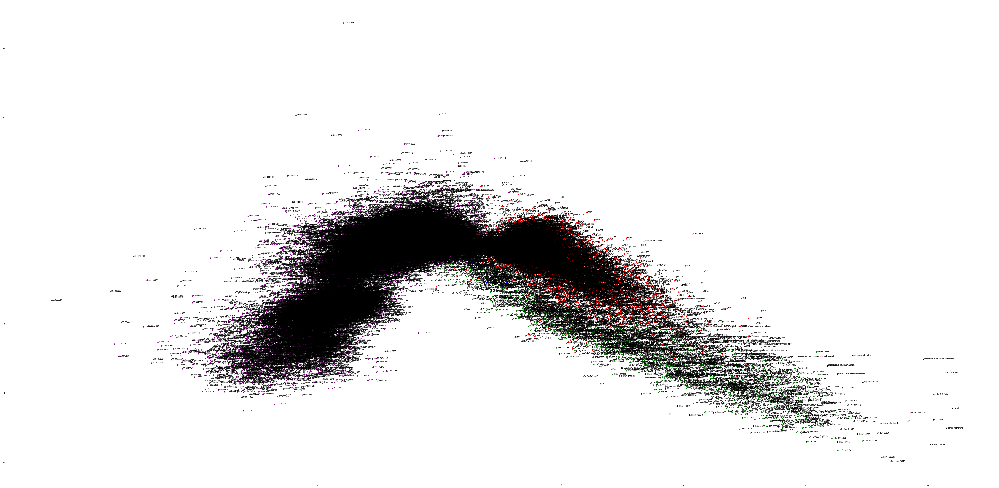

In [36]:
import matplotlib
# fit a 2d PCA model to the vectors
X = model[model.wv.vocab]
pca = PCA(n_components=2)
result = pca.fit_transform(X)
# create a scatter plot of the projection
plt.scatter(result[:, 0], result[:, 1], c=labels, cmap=matplotlib.colors.ListedColormap(colors))
words = list(model.wv.vocab)
for i, word in enumerate(words):
    plt.annotate(word, xy=(result[i, 0], result[i, 1]))
plt.show()

In [37]:
model.most_similar("cytosol")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('ciliary base', 0.7762970924377441),
 ('Golgi-associated vesicle membrane', 0.7598305940628052),
 ('endosome membrane', 0.7593172192573547),
 ('cell junction', 0.7477518320083618),
 ('chromosome, centromeric region', 0.7446448802947998),
 ('mitochondrial outer membrane', 0.7430593371391296),
 ('chromosome', 0.7409131526947021),
 ('clathrin-sculpted gamma-aminobutyric acid transport vesicle membrane',
  0.7394140958786011),
 ('late endosome lumen', 0.7384960651397705),
 ('cytoplasmic vesicle membrane', 0.7376633882522583)]

In [38]:
model.most_similar(positive=['superc'], negative=['normal'])

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('is-variant-of-superc', 0.42619746923446655),
 ('superc21', 0.36283615231513977),
 ('superc-has-variant', 0.34233546257019043),
 ('9:33995053_A/G', 0.33516383171081543),
 ('GO:0019128', 0.32959574460983276),
 ('8:17426144_T/C', 0.3239944279193878),
 ('GO:0019124', 0.3226878046989441),
 ('4:158285596_C/T', 0.3188420832157135),
 ('GO:0042025', 0.31721031665802),
 ('superc3', 0.316775381565094)]

In [39]:
model.most_similar("superc")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('superc21', 0.6591680645942688),
 ('superc13', 0.6559872627258301),
 ('superc23', 0.6489865779876709),
 ('superc24', 0.6448923349380493),
 ('superc25', 0.643523097038269),
 ('superc4', 0.6433202624320984),
 ('superc7', 0.6423109769821167),
 ('superc10', 0.6381571292877197),
 ('superc6', 0.6370151042938232),
 ('superc0', 0.6321567296981812)]

In [40]:
#+b cell differentiation, -t cell differentiation,+ t cell proliferation
model.most_similar(positive=['GO:0030183','GO:0042098'], negative=['GO:0030217'])
#first one should be GO:0042100, b cell proliferation

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


[('GO:0042100', 0.6568751931190491),
 ('GO:0050798', 0.5983533263206482),
 ('GO:0042113', 0.5789616703987122),
 ('GO:0042130', 0.5786203145980835),
 ('GO:0042102', 0.5779260396957397),
 ('GO:0046007', 0.5693103075027466),
 ('GO:0001777', 0.547123372554779),
 ('GO:0030889', 0.5434648394584656),
 ('GO:0046651', 0.5423434972763062),
 ('GO:0046630', 0.5422981977462769)]

In [41]:
#+nucleus, +mitochondrial genome maintenence,-mitochondria
model.most_similar(positive=['GO:0005634','GO:0005739'], negative=['GO:0000002'])
#first one should be GO:0051276, nuclear genome maintenence

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


[('GO:0005654', 0.5478025674819946),
 ('GO:0016235', 0.47738999128341675),
 ('GO:0005829', 0.4723255932331085),
 ('GO:0005730', 0.4700695872306824),
 ('GO:0005793', 0.466620534658432),
 ('GO:0005737', 0.461140513420105),
 ('HSDL1', 0.4600357413291931),
 ('GO:0005783', 0.4535007178783417),
 ('GO:0020009', 0.4471006989479065),
 ('ZNF326', 0.44267261028289795)]

In [42]:
#+nucleus, +mitochondrial genome maintenence,-mitochondria
model.most_similar(positive=['GO:0005634','GO:0000002'], negative=['GO:0005739'])
#first one should be GO:0051276, nuclear genome maintenence

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


[('GO:0001158', 0.5406532287597656),
 ('GO:0000981', 0.5399954319000244),
 ('GO:0000790', 0.539262056350708),
 ('GO:0033955', 0.5336794257164001),
 ('GO:0043565', 0.5066572427749634),
 ('GO:0003677', 0.5051217079162598),
 ('GO:0001940', 0.4974924325942993),
 ('GO:0000980', 0.49575355648994446),
 ('GO:0003714', 0.4954644441604614),
 ('GO:0001227', 0.4951111674308777)]

In [43]:
#+nuclear transcription factor complex, +mitochondrial genome maintenence,-mitochondrian transcription
model.most_similar(positive=['GO:0044798','GO:0000002'], negative=['GO:0006390'])
#first one should be GO:0051276, nuclear genome maintenence

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


[('GO:0090576', 0.5472763776779175),
 ('GO:0090577', 0.5407727956771851),
 ('GO:0044797', 0.529909610748291),
 ('GO:0090575', 0.5129988193511963),
 ('GO:0070721', 0.5074305534362793),
 ('GO:0090578', 0.5061635971069336),
 ('GO:0030232', 0.5022324919700623),
 ('GO:0071150', 0.5003576278686523),
 ('GO:0030907', 0.49613332748413086),
 ('GO:0097221', 0.48963963985443115)]

In [44]:
genemembers = {}
for sentence in phrases:
    if sentence[1] == 'has-gene-ontology-member':
        if sentence[0] not in genemembers:
            genemembers[sentence[0]] = set()
        genemembers[sentence[0]].add(sentence[2])

In [45]:
gomembers = {}
for sentence in phrases:
    if sentence[1]=='geneontologyterm-inherited-by':
        if sentence[0] not in gomembers:
            gomembers[sentence[0]] = set()
        gomembers[sentence[0]].add(sentence[2])

In [49]:
import pandas as pd
infodf = pd.read_csv("csv/agingGOterms.csv")

In [50]:
aging_goterms= list(infodf["GOID"])

In [51]:
aging_goterms

['GO:0001300',
 'GO:0001301',
 'GO:0001302',
 'GO:0001303',
 'GO:0001304',
 'GO:0001305',
 'GO:0001307',
 'GO:0001308',
 'GO:0001310',
 'GO:0001311',
 'GO:0001312',
 'GO:0001313',
 'GO:0001314',
 'GO:0001316',
 'GO:0001317',
 'GO:0001318',
 'GO:0001319',
 'GO:0001320',
 'GO:0001321',
 'GO:0001322',
 'GO:0001323',
 'GO:0001324',
 'GO:0006323',
 'GO:0007568',
 'GO:0007569',
 'GO:0007580',
 'GO:0010259',
 'GO:0010978',
 'GO:0019072',
 'GO:0019073',
 'GO:0019074',
 'GO:0034652',
 'GO:0035177',
 'GO:0036385',
 'GO:0036386',
 'GO:0039631',
 'GO:0039632',
 'GO:0044815',
 'GO:0060756',
 'GO:0060757',
 'GO:0060758',
 'GO:0061434',
 'GO:0090139',
 'GO:0090342',
 'GO:0090343',
 'GO:0090344',
 'GO:0098006',
 'GO:0098035',
 'GO:0098036',
 'GO:0098037',
 'GO:1900007',
 'GO:1900008',
 'GO:1900009',
 'GO:1900062',
 'GO:1900160',
 'GO:1903368',
 'GO:1903369',
 'GO:1903370',
 'GO:1905137',
 'GO:1905138']

In [52]:
#each gene onotlogy term as measured by the genes

def compute_simularity_ratios(genemembers):
    num_first =0
    top_ten = 0
    total = 0
    num_first_aging = 0
    top_ten_aging = 0
    total_aging = 0

    for ontology_term, gene_children in genemembers.items() :
        children = list(gene_children)
        if all(gene in model.wv.vocab for gene in children):
            simlist = model.most_similar(positive=children)
            if len (simlist) >0:
                total +=1
                if ontology_term in aging_goterms:
                    total_aging +=1
                if simlist[0][0]==ontology_term:
                    num_first += 1
                    if ontology_term in aging_goterms:
                        num_first_aging +=1
                is_in_top_ten = False
                for tup in simlist:
                    if tup[0]==ontology_term:
                        is_in_top_ten = True 
                if is_in_top_ten:
                    if ontology_term in aging_goterms:
                        top_ten_aging +=1
                    top_ten += 1

    ratio_in_top_ten= top_ten/total if total !=0 else 0
    ratio_first= num_first/total if total !=0 else 0
    ratio_in_top_ten_aging= top_ten_aging/total_aging if total_aging !=0 else 0
    ratio_first_aging= num_first_aging/total_aging if total_aging !=0 else 0
    return (ratio_first,ratio_in_top_ten,ratio_first_aging,ratio_in_top_ten_aging)

In [53]:
ratio_first, ratio_in_top_ten ,ratio_first_aging, ratio_in_top_ten_aging = compute_simularity_ratios(genemembers)
print ("Ratio of gene ontology terms that are closest to sum of gene children is {0}".format(ratio_first))
print ("Ratio of gene ontology terms that are top ten closest to sum of gene children is {0}".format(ratio_in_top_ten))
print ("Ratio of aging gene ontology terms that are closest to sum of gene children is {0}".format(ratio_first_aging))
print ("Ratio of aging gene ontology terms that are top ten closest to sum of gene children is {0}".format(ratio_in_top_ten_aging))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


Ratio of gene ontology terms that are closest to sum of gene children is 0.07615439521221105
Ratio of gene ontology terms that are top ten closest to sum of gene children is 0.24762532257178937
Ratio of aging gene ontology terms that are closest to sum of gene children is 0.1
Ratio of aging gene ontology terms that are top ten closest to sum of gene children is 0.2


In [54]:
#each gene onotlogy term as measured by child ontology terms
ratio_first1, ratio_in_top_ten1 ,ratio_first_aging1, ratio_in_top_ten_aging1 = compute_simularity_ratios(gomembers)
print ("Ratio of gene ontology terms that are closest to sum of gene ontology term children is {0}".format(ratio_first1))
print ("Ratio of gene ontology terms that are top ten closest to sum of gene ontology term children is {0}".format(ratio_in_top_ten1))
print ("Ratio of aging gene ontology terms that are closest to sum of gene ontology term children is {0}".format(ratio_first_aging1))
print ("Ratio of aging gene ontology terms that are top ten closest to sum of gene ontology term children is {0}".format(ratio_in_top_ten_aging1))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  


Ratio of gene ontology terms that are closest to sum of gene ontology term children is 0.6233313987231572
Ratio of gene ontology terms that are top ten closest to sum of gene ontology term children is 0.9471271038885665
Ratio of aging gene ontology terms that are closest to sum of gene ontology term children is 0.5384615384615384
Ratio of aging gene ontology terms that are top ten closest to sum of gene ontology term children is 0.9615384615384616


In [55]:
len(model.wv.vocab)

110259

In [56]:
model.most_similar(positive=supercpersonlist)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('X:11783658_G/A', 0.7260770797729492),
 ('9:97823110_C/T', 0.6974513530731201),
 ('X:32509625_A/C', 0.6961500644683838),
 ('16:8891471_T/C', 0.6928807497024536),
 ('12:131555329_C/A', 0.6652129888534546),
 ('17:56386732_C/T', 0.6598349809646606),
 ('superc-has-variant', 0.6554408669471741),
 ('22:50659071_G/C', 0.6439723968505859),
 ('1:241795972_C/T', 0.639644205570221),
 ('11:43919707_A/G', 0.636598527431488)]

In [57]:
model.most_similar("inhibits")

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


KeyError: "word 'inhibits' not in vocabulary"

In [58]:
# JJJ
#+b cell differentiation, -t cell differentiation, + t cell proliferation
model.most_similar(positive=['GO:0030183','GO:0042098'], negative=['GO:0030217'])
#first one should be GO:0042100, b cell proliferation

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


[('GO:0042100', 0.6568751931190491),
 ('GO:0050798', 0.5983533263206482),
 ('GO:0042113', 0.5789616703987122),
 ('GO:0042130', 0.5786203145980835),
 ('GO:0042102', 0.5779260396957397),
 ('GO:0046007', 0.5693103075027466),
 ('GO:0001777', 0.547123372554779),
 ('GO:0030889', 0.5434648394584656),
 ('GO:0046651', 0.5423434972763062),
 ('GO:0046630', 0.5422981977462769)]

In [205]:
# JJJ
# f1 = open("pln_pairs.txt", "r")
f1 = open("dw_pairs.txt", "r")
lines = f1.readlines()

# f2 = open("dw_results.txt", "w")
f2 = open("dw_results_all.txt", "w")

for line in lines:
    # print("Reading: {}".format(line))
    gos = line.split(",")
    go1 = gos[0].strip()
    go2 = gos[1].strip()
    # if go1 in model.wv.vocab and go2 in model.wv.vocab:
    go_similarity = model.similarity(go1, go2)
    print("Similarity between {} and {} is {}\n".format(go1, go2, go_similarity))
    f2.write("{},{},{}\n".format(go1, go2, go_similarity))

f1.close()
f2.close()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:15: DeprecationWarning: Call to deprecated `similarity` (Method will be removed in 4.0.0, use self.wv.similarity() instead).
  from ipykernel import kernelapp as app


Similarity between GO:0021666 and GO:0007611 is 0.29197466373443604

Similarity between GO:0007613 and GO:0019886 is 0.13569320738315582

Similarity between GO:0008270 and GO:0046914 is 0.66312575340271

Similarity between GO:0046872 and GO:0052890 is -0.030745331197977066

Similarity between GO:0016627 and GO:0052760 is 0.5462044477462769

Similarity between GO:0002909 and GO:0002908 is 0.8275363445281982

Similarity between GO:0002868 and GO:0002516 is 0.877691924571991

Similarity between GO:0001783 and GO:0006959 is 0.40307939052581787

Similarity between GO:0002922 and GO:0006956 is 0.5841362476348877

Similarity between GO:0034554 and GO:0016491 is -0.09277182817459106

Similarity between GO:0051353 and GO:1903870 is 0.4512922465801239

Similarity between GO:0004489 and GO:0016646 is 0.46017923951148987

Similarity between GO:0047127 and GO:0016645 is 0.5895667672157288

Similarity between GO:0003824 and GO:0072005 is 0.022473428398370743

Similarity between GO:0048496 and GO:005

Similarity between GO:1903365 and GO:0044330 is -0.18581585586071014

Similarity between GO:0023051 and GO:0032409 is 0.21488283574581146

Similarity between GO:0045780 and GO:0045124 is 0.6663970947265625

Similarity between GO:1905255 and GO:0032630 is 0.33354461193084717

Similarity between GO:0032710 and GO:0045534 is 0.9139547944068909

Similarity between GO:0045526 and GO:0042036 is 0.4846324920654297

Similarity between GO:0030808 and GO:0061126 is 0.4041203260421753

Similarity between GO:0061124 and GO:0061128 is 0.9628231525421143

Similarity between GO:0061119 and GO:0061125 is 0.9327136874198914

Similarity between GO:0061123 and GO:0061129 is 0.6519579291343689

Similarity between GO:0061121 and GO:2000101 is 0.23380979895591736

Similarity between GO:0042127 and GO:0031515 is -0.0446205772459507

Similarity between GO:0043559 and GO:0051424 is 0.34485769271850586

Similarity between GO:0045744 and GO:0140194 is 0.7557145953178406

Similarity between GO:0086096 and GO:1905

Similarity between GO:0015385 and GO:0038028 is 0.09311823546886444

Similarity between GO:0031340 and GO:1902933 is 0.007251127623021603

Similarity between GO:1902934 and GO:1901617 is 0.842556357383728

Similarity between GO:1901735 and GO:1901737 is 0.6351715326309204

Similarity between GO:0106109 and GO:1902271 is 0.01170410681515932

Similarity between GO:1902118 and GO:0005499 is 0.737909734249115

Similarity between GO:0005496 and GO:1905599 is 0.035306211560964584

Similarity between GO:0046672 and GO:1901694 is 0.9007201790809631

Similarity between GO:1990010 and GO:1990009 is 0.6186424493789673

Similarity between GO:0032924 and GO:0032881 is 0.041385337710380554

Similarity between GO:2000948 and GO:2000950 is 0.7950376272201538

Similarity between GO:2000953 and GO:2000899 is 0.8946750164031982

Similarity between GO:2000952 and GO:2000989 is 0.9573813080787659

Similarity between GO:2000949 and GO:0015221 is 0.09978040307760239

Similarity between GO:1901505 and GO:1901


Similarity between GO:0009264 and GO:0009882 is 0.1942068338394165

Similarity between GO:0043153 and GO:0004722 is 0.2523394525051117

Similarity between GO:0004724 and GO:1905184 is 0.6157370805740356

Similarity between GO:0032516 and GO:0071339 is -0.0025569272693246603

Similarity between GO:0044665 and GO:0035097 is 0.7518978118896484

Similarity between GO:0034708 and GO:0031533 is 0.738905668258667

Similarity between GO:0022850 and GO:0051378 is 0.9072099328041077

Similarity between GO:0007198 and GO:0099154 is 0.6108174324035645

Similarity between GO:0045202 and GO:0098691 is 0.563310444355011

Similarity between GO:0032223 and GO:0045267 is 0.06514933705329895

Similarity between GO:0070209 and GO:0097226 is 0.062189262360334396

Similarity between GO:0015779 and GO:1901656 is 0.907620370388031

Similarity between GO:1900753 and GO:0002232 is 0.24665986001491547

Similarity between GO:0030595 and GO:0061502 is 0.23996391892433167

Similarity between GO:0033157 and GO:0042

Similarity between GO:0034233 and GO:0034234 is 0.9601396322250366

Similarity between GO:2000966 and GO:0046140 is 0.15586978197097778

Similarity between GO:1901464 and GO:1902130 is 0.14835454523563385

Similarity between GO:1902131 and GO:0046431 is 0.6416406035423279

Similarity between GO:1900785 and GO:1900767 is 0.8412926197052002

Similarity between GO:1900588 and GO:0042810 is 0.4796834886074066

Similarity between GO:0042811 and GO:0099104 is -0.00036115047987550497

Similarity between GO:0099108 and GO:0015459 is 0.6764495968818665

Similarity between GO:0044774 and GO:0007093 is 0.7201408743858337

Similarity between GO:1990492 and GO:0030837 is 0.21635876595973969

Similarity between GO:0042989 and GO:0044205 is 0.03930850327014923

Similarity between GO:0060561 and GO:0010614 is 0.26031744480133057

Similarity between GO:1903243 and GO:1904009 is 0.09365569055080414

Similarity between GO:1902065 and GO:0043200 is 0.5371322631835938

Similarity between GO:0097068 and GO:


Similarity between GO:0002536 and GO:0007637 is 0.05516738072037697

Similarity between GO:0009605 and GO:0106186 is 0.03695962205529213

Similarity between GO:0009898 and GO:0018516 is 0.10444005578756332

Similarity between GO:0002794 and GO:0002759 is 0.5628061890602112

Similarity between GO:0008348 and GO:1905792 is 0.3285774886608124

Similarity between GO:0001522 and GO:0048247 is 0.08423183113336563

Similarity between GO:0002551 and GO:0060754 is 0.7986781597137451

Similarity between GO:0002690 and GO:0140069 is -0.09020688384771347

Similarity between GO:0010617 and GO:0010961 is 0.3477523922920227

Similarity between GO:0014824 and GO:0014830 is 0.7472922801971436

Similarity between GO:0034320 and GO:0047160 is 0.8531818985939026

Similarity between GO:0050643 and GO:0010698 is 0.2034130096435547

Similarity between GO:0010414 and GO:0010413 is 0.962040364742279

Similarity between GO:0043112 and GO:0150065 is 0.2277330458164215

Similarity between GO:0150067 and GO:01500


Similarity between GO:0042400 and GO:0050146 is 0.16550396382808685

Similarity between GO:1904986 and GO:1900947 is 0.4034954607486725

Similarity between GO:1900480 and GO:1901513 is 0.2070307433605194

Similarity between GO:0036113 and GO:0036116 is 0.7327002882957458

Similarity between GO:0102689 and GO:0050508 is 0.40739431977272034

Similarity between GO:0102921 and GO:0014890 is 0.2254035770893097

Similarity between GO:0010615 and GO:0014887 is 0.8808407783508301

Similarity between GO:0010612 and GO:0045052 is 0.08444620668888092

Similarity between GO:0045048 and GO:0071816 is 0.791674017906189

Similarity between GO:0051291 and GO:0140255 is 0.002486561890691519

Similarity between GO:0140256 and GO:0120020 is -0.0860004723072052

Similarity between GO:0016200 and GO:0046634 is 0.2710409462451935

Similarity between GO:0022893 and GO:0015192 is 0.8381710052490234

Similarity between GO:0009818 and GO:0002251 is 0.4976808428764343

Similarity between GO:0039717 and GO:00397


Similarity between GO:0039531 and GO:0039532 is 0.7414986491203308

Similarity between GO:0047434 and GO:0052701 is 0.3409779667854309

Similarity between GO:0052698 and GO:0030329 is 0.7839282751083374

Similarity between GO:0046311 and GO:0004386 is -0.0617007240653038

Similarity between GO:0033698 and GO:0070822 is 0.8865786194801331

Similarity between GO:0033687 and GO:0033689 is 0.8125196099281311

Similarity between GO:0033690 and GO:0032012 is -0.010913065634667873

Similarity between GO:0120183 and GO:0120181 is 0.8591605424880981

Similarity between GO:0120180 and GO:0042893 is 0.09368740022182465

Similarity between GO:0042381 and GO:0047758 is 0.1794375479221344

Similarity between GO:1900023 and GO:1900022 is 0.7719228267669678

Similarity between GO:1900148 and GO:1904267 is 0.8906763195991516

Similarity between GO:1990751 and GO:0061352 is 0.42039984464645386

Similarity between GO:0061334 and GO:0021979 is 0.2016081064939499

Similarity between GO:0021886 and GO:0102


Similarity between GO:1904643 and GO:1902267 is 0.01615191251039505

Similarity between GO:0033467 and GO:0034743 is 0.07084407657384872

Similarity between GO:1990727 and GO:0102356 is 0.2444036304950714

Similarity between GO:0000077 and GO:1990248 is 0.41257643699645996

Similarity between GO:0044101 and GO:0043185 is 0.28943508863449097

Similarity between GO:0042334 and GO:0046957 is 0.8995271325111389

Similarity between GO:0000125 and GO:0002878 is 0.031200552359223366

Similarity between GO:0034042 and GO:0046182 is 0.2337464988231659

Similarity between GO:0019523 and GO:0002815 is 0.20193912088871002

Similarity between GO:0098905 and GO:0098678 is 0.25301477313041687

Similarity between GO:0035671 and GO:0102745 is 0.6947245597839355

Similarity between GO:0102422 and GO:0047211 is 0.7491492033004761

Similarity between GO:2000253 and GO:0038170 is 0.2554931938648224

Similarity between GO:1904964 and GO:0019249 is 0.14568808674812317

Similarity between GO:0019244 and GO:0


Similarity between GO:0043906 and GO:0002161 is 0.8721106052398682

Similarity between GO:0010412 and GO:0033769 is 0.22689704596996307

Similarity between GO:0030962 and GO:1900738 is 0.14231815934181213

Similarity between GO:1905574 and GO:1904067 is 0.3165888488292694

Similarity between GO:0060376 and GO:0004121 is 0.03854699060320854

Similarity between GO:0032823 and GO:0032826 is 0.8307629823684692

Similarity between GO:0046064 and GO:0006239 is 0.9732711315155029

Similarity between GO:0010139 and GO:0019396 is 0.3898208737373352

Similarity between GO:0019328 and GO:1900811 is 0.596184253692627

Similarity between GO:0045994 and GO:0070110 is 0.1435818374156952

Similarity between GO:0070760 and GO:0038162 is 0.3786171078681946

Similarity between GO:0036521 and GO:0042415 is 0.1003393828868866

Similarity between GO:0033505 and GO:0043597 is 0.02131829597055912

Similarity between GO:0005657 and GO:0004771 is 0.14068996906280518

Similarity between GO:0102568 and GO:001906


Similarity between GO:0070296 and GO:0008694 is 0.15413179993629456

Similarity between GO:1902325 and GO:0015995 is 0.8196849822998047

Similarity between GO:0046149 and GO:0006582 is 0.5933480858802795

Similarity between GO:0009876 and GO:0048843 is 0.14758886396884918

Similarity between GO:2000772 and GO:0034687 is -0.028976745903491974

Similarity between GO:0034685 and GO:0048179 is 0.4408394396305084

Similarity between GO:1905756 and GO:0060645 is 0.3751075267791748

Similarity between GO:0060646 and GO:0071391 is 0.17314650118350983

Similarity between GO:0045328 and GO:2000170 is 0.19331489503383636

Similarity between GO:0034164 and GO:0009902 is -0.038255929946899414

Similarity between GO:0009904 and GO:0051667 is 0.8638357520103455

Similarity between GO:0046132 and GO:0046091 is 0.5241352319717407

Similarity between GO:0000028 and GO:0000350 is 0.6256951093673706

Similarity between GO:0021957 and GO:0098725 is 0.0586857795715332

Similarity between GO:0016207 and GO:


Similarity between GO:1903138 and GO:0000196 is 0.9106378555297852

Similarity between GO:0044353 and GO:1902107 is 0.12666887044906616

Similarity between GO:1903706 and GO:0045918 is 0.10783713310956955

Similarity between GO:0048316 and GO:0004571 is -0.010096539743244648

Similarity between GO:0043573 and GO:0043572 is 0.9637143015861511

Similarity between GO:1905193 and GO:1904827 is 0.5704898238182068

Similarity between GO:1900834 and GO:0047463 is 0.376887708902359

Similarity between GO:0089710 and GO:0070518 is 0.18448297679424286

Similarity between GO:0030120 and GO:0030127 is 0.8900222182273865

Similarity between GO:0032919 and GO:0032917 is 0.9378131031990051

Similarity between GO:1900519 and GO:0052605 is 0.13315723836421967

Similarity between GO:2000257 and GO:2000260 is 0.792084276676178

Similarity between GO:2000261 and GO:1905394 is -0.004513559862971306

Similarity between GO:0008309 and GO:0015143 is 0.2095707505941391

Similarity between GO:0017194 and GO:00


Similarity between GO:1903229 and GO:0070179 is 0.26945754885673523

Similarity between GO:0120012 and GO:0036311 is 0.02073606848716736

Similarity between GO:1903947 and GO:0008475 is -0.0456593856215477

Similarity between GO:0097197 and GO:0044862 is 0.038005560636520386

Similarity between GO:1901329 and GO:0015421 is 0.03170936927199364

Similarity between GO:0050357 and GO:0045330 is 0.7227328419685364

Similarity between GO:2000980 and GO:0033288 is 0.39433643221855164

Similarity between GO:0062104 and GO:0051464 is -0.07597962766885757

Similarity between GO:0046110 and GO:0050518 is 0.30748021602630615

Similarity between GO:0150173 and GO:0071500 is 0.09370126575231552

Similarity between GO:0009736 and GO:1901414 is 0.478230744600296

Similarity between GO:0001504 and GO:0140107 is 0.16983211040496826

Similarity between GO:0034809 and GO:0043958 is 0.9704480767250061

Similarity between GO:0070734 and GO:0102237 is 0.06809859722852707

Similarity between GO:0140329 and G


Similarity between GO:0001519 and GO:2000422 is 0.3218129575252533

Similarity between GO:0001862 and GO:0003357 is -0.001465426292270422

Similarity between GO:1904887 and GO:0034016 is -0.011363906785845757

Similarity between GO:0034018 and GO:0061073 is 0.008160773664712906

Similarity between GO:0047331 and GO:0030903 is 0.03795010596513748

Similarity between GO:1905183 and GO:0044864 is 0.011903263628482819

Similarity between GO:2000819 and GO:0033203 is 0.24519561231136322

Similarity between GO:0098654 and GO:0005956 is 0.6797478795051575

Similarity between GO:0003025 and GO:0001127 is 0.14098452031612396

Similarity between GO:0071369 and GO:1900359 is -0.04114339500665665

Similarity between GO:0046260 and GO:1901867 is 0.4628881514072418

Similarity between GO:0047848 and GO:0010428 is 0.06514766067266464

Similarity between GO:1904254 and GO:0034537 is 0.38731080293655396

Similarity between GO:0075713 and GO:0034734 is 0.12846490740776062

Similarity between GO:0000215


Similarity between GO:0047435 and GO:0010704 is 0.14097705483436584

Similarity between GO:0000706 and GO:0060230 is -0.016222072765231133

Similarity between GO:0072179 and GO:0070039 is 0.07695090025663376

Similarity between GO:0005889 and GO:0017118 is 0.0996473878622055

Similarity between GO:0102581 and GO:0007354 is 0.08384986966848373

Similarity between GO:0003233 and GO:0047161 is 0.19972394406795502

Similarity between GO:1902972 and GO:0008750 is 0.13744927942752838

Similarity between GO:0018220 and GO:1905761 is 0.13693207502365112

Similarity between GO:0047657 and GO:0140358 is 0.2923845052719116

Similarity between GO:0032837 and GO:0062055 is 0.19704358279705048

Similarity between GO:0000983 and GO:0002055 is 0.07564610987901688

Similarity between GO:0050132 and GO:0098774 is 0.2841063439846039

Similarity between GO:0047791 and GO:0047517 is 0.5509588122367859

Similarity between GO:0043905 and GO:0047585 is 0.8193437457084656

Similarity between GO:0001859 and GO

In [84]:
# JJJ
go_vocabs = []
go_pairs = []
f = open("dw_pairs.txt", "w")
for v in model.wv.vocab:
    if v.startswith("GO:"):
        go_vocabs.append(v)
        # f.write(v + "\n")

i = 0
while (i + 1) < len(go_vocabs):
    f.write(go_vocabs[i] + "," + go_vocabs[i+1] + "\n")
    i = i + 2

f.close()

Number of GO pairs in experiment = 22417
Number of matches = 4923 (21.96%)
Number of PLN IntensionalSimilarityLinks with default (stv 1 0) = 19845


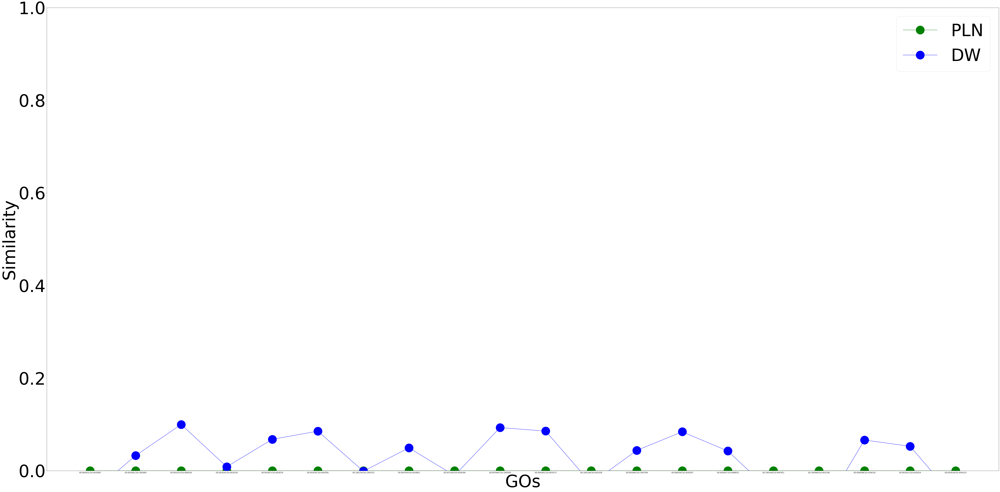

In [207]:
import numpy as np
import matplotlib.pyplot as plt

# Read results
# f1 = open("pln_results.txt", "r")
# f2 = open("dw_results.txt", "r")
f1 = open("pln_results_all.txt", "r")
f2 = open("dw_results_all.txt", "r")
lines1 = f1.readlines()
lines2 = f2.readlines()
f1.close()
f2.close()

# Populate
gos = []
data_pln = []
data_dw = []
data_pln_default_stv = 0
for line in lines1:
    e = line.split(",")
    v = float(e[2].strip())
    data_pln.append(v)
    if v == 0:
        data_pln_default_stv = data_pln_default_stv + 1
    gos.append(e[0] + "," + e[1])
for line in lines2:
    e = line.split(",")
    data_dw.append(float(e[2].strip()))
# print(gos)
# print(data_pln)
# print(data_dw)

# See which matches which doesn't
match_gos = []
match_data_pln = []
match_data_dw = []
no_match_gos = []
no_match_data_pln = []
no_match_data_dw = []
margin = 0.1
i = 0
while (i < len(gos)):
    if abs(data_pln[i] - data_dw[i]) < margin:
    # if abs(data_pln[i] - data_dw[i]) < margin and data_pln[i] > 0:
        match_gos.append(gos[i])
        match_data_pln.append(data_pln[i])
        match_data_dw.append(data_dw[i])
    else:
        no_match_gos.append(gos[i])
        no_match_data_pln.append(data_pln[i])
        no_match_data_dw.append(data_dw[i])
    i = i + 1

print("Number of GO pairs in experiment = {}".format(len(gos)))
print("Number of matches = {} ({:.2f}%)".format(len(match_gos), ((len(match_gos)/len(gos))*100)))
# print("Number of un-matches = {}".format(len(no_match_gos)))
print("Number of PLN IntensionalSimilarityLinks with default (stv 1 0) = {}".format(data_pln_default_stv))

# Randomly pick n GOs to show
import random
n = 20
'''
## Randomly pick from all GOs
idx = random.sample(range(len(gos)), n)
selected_gos = [gos[i] for i in idx]
selected_pln = [data_pln[i] for i in idx]
selected_dw = [data_dw[i] for i in idx]
'''
## Randomly pick from matched GOs
idx = random.sample(range(len(match_gos)), n)
selected_gos = [match_gos[i] for i in idx]
selected_pln = [match_data_pln[i] for i in idx]
selected_dw = [match_data_dw[i] for i in idx]
'''
## Randomly pick from unmatched GOs
idx = random.sample(range(len(no_match_gos)), n)
selected_gos = [no_match_gos[i] for i in idx]
selected_pln = [no_match_data_pln[i] for i in idx]
selected_dw = [no_match_data_dw[i] for i in idx]
'''
# print(selected_gos)
# print(selected_pln)
# print(selected_dw)

# Plot
ms=50
lfs=100
plt.plot(selected_gos, selected_pln, 'go-', markersize=ms, label='PLN')
plt.plot(selected_gos, selected_dw, 'bo-', markersize=ms, label='DW')
plt.xlabel('GOs', fontsize=lfs)
plt.ylabel('Similarity', fontsize=lfs)
plt.legend(loc='best')
plt.ylim(0, 1)
plt.show()

In [202]:
same = 0
diff = 0

for g in match_gos:
    gp = g.split(",")
    g1 = gp[0]
    g2 = gp[1]
    q1 = construct_eval_query("GO_name", ConceptNode(g1))
    q2 = construct_eval_query("GO_name", ConceptNode(g2))
    q3 = construct_eval_query("GO_namespace", ConceptNode(g1))
    q4 = construct_eval_query("GO_namespace", ConceptNode(g2))
    
    g1_name = "" if q1 == [] else q1[0].name
    g2_name = "" if q2 == [] else q2[0].name
    g1_type = "" if q3 == [] else q3[0].name
    g2_type = "" if q4 == [] else q4[0].name
    print("{} ({}) - {}\n{} ({}) - {}\n".format(g1, g1_name, g1_type, g2, g2_name, g2_type))

    if g1_type == g2_type:
        same = same + 1
    else:
        diff = diff + 1
print("Same = {} ({:.2f})\nDiff = {}".format(same, (same/(same+diff)), diff))

GO:0103026 (fructose-1-phosphatase activity) - molecular_function
GO:0090166 (Golgi disassembly) - biological_process

GO:0047789 (creatininase activity) - molecular_function
GO:0033971 (hydroxyisourate hydrolase activity) - molecular_function

GO:0046805 (protein-heme linkage via 1'-L-histidine) - biological_process
GO:0018174 (protein-heme P460 linkage) - biological_process

GO:1902028 (regulation of histone H3-K18 acetylation) - biological_process
GO:0050756 (fractalkine metabolic process) - biological_process

GO:1900797 (cordyol C metabolic process) - biological_process
GO:0098937 (anterograde dendritic transport) - biological_process

GO:0102689 (UDP-glucose:isopentenyladenine 7-N-glucosyltransferase activity) - molecular_function
GO:0050508 (glucuronosyl-N-acetylglucosaminyl-proteoglycan 4-alpha-N-acetylglucosaminyltransferase activity) - molecular_function

GO:0044155 (host caveola) - cellular_component
GO:1900770 (fumitremorgin B metabolic process) - biological_process

GO:004


GO:0062087 (positive regulation of vein smooth muscle contraction) - biological_process
GO:0052772 (brefeldin A esterase activity) - molecular_function

GO:0039534 (negative regulation of MDA-5 signaling pathway) - biological_process
GO:0031690 (adrenergic receptor binding) - molecular_function

GO:0043751 (polyphosphate:AMP phosphotransferase activity) - molecular_function
GO:0036038 (MKS complex) - cellular_component

GO:0097389 (chemokine (C-C motif) ligand 21 production) - biological_process
GO:0070674 (hypoxanthine dehydrogenase activity) - molecular_function

GO:0052651 (monoacylglycerol catabolic process) - biological_process
GO:0046464 (acylglycerol catabolic process) - biological_process

GO:0150038 (postsynaptic dense core vesicle exocytosis) - biological_process
GO:0099003 (vesicle-mediated transport in synapse) - biological_process

GO:0098909 (regulation of cardiac muscle cell action potential involved in regulation of contraction) - biological_process
GO:0085039 (extra-i


GO:0043293 (apoptosome) - cellular_component
GO:1990728 (mitotic spindle assembly checkpoint MAD1-MAD2 complex) - cellular_component

GO:0035582 (sequestering of BMP in extracellular matrix) - biological_process
GO:0030514 (negative regulation of BMP signaling pathway) - biological_process

GO:0050073 (macrolide 2'-kinase activity) - molecular_function
GO:0097664 (SCF-Grr1/Pof2 ubiquitin ligase complex) - cellular_component

GO:0120083 (rough endoplasmic reticulum cisterna) - cellular_component
GO:1903412 (response to bile acid) - biological_process

GO:0046223 (aflatoxin catabolic process) - biological_process
GO:1900987 (ajmaline catabolic process) - biological_process

GO:0071232 (cellular response to histidine) - biological_process
GO:1990427 (stereocilia tip-link density) - cellular_component

GO:0060368 (regulation of Fc receptor mediated stimulatory signaling pathway) - biological_process
GO:0106107 (regulation of (R)-mevalonic acid biosynthetic process) - biological_process

G


GO:0010464 (regulation of mesenchymal cell proliferation) - biological_process
GO:0021937 (cerebellar Purkinje cell-granule cell precursor cell signaling involved in regulation of granule cell precursor cell proliferation) - biological_process

GO:0010138 (pyrimidine ribonucleotide salvage) - biological_process
GO:0044211 (CTP salvage) - biological_process

GO:0003913 (DNA photolyase activity) - molecular_function
GO:0004652 (polynucleotide adenylyltransferase activity) - molecular_function

GO:0034309 (primary alcohol biosynthetic process) - biological_process
GO:0046169 (methanol biosynthetic process) - biological_process

GO:0052645 (F420-0 metabolic process) - biological_process
GO:0018601 (4-nitrophenol 2-monooxygenase activity) - molecular_function

GO:0035577 (azurophil granule membrane) - cellular_component
GO:0071705 (nitrogen compound transport) - biological_process

GO:0002829 (negative regulation of type 2 immune response) - biological_process
GO:0055102 (lipase inhibitor 


GO:0047287 (lactosylceramide alpha-2,6-N-sialyltransferase activity) - molecular_function
GO:0030264 (nuclear fragmentation involved in apoptotic nuclear change) - biological_process

GO:1901308 (regulation of sterol regulatory element binding protein cleavage) - biological_process
GO:0070613 (regulation of protein processing) - biological_process

GO:0035888 (isoguanine deaminase activity) - molecular_function
GO:0003037 (detection of pH by carotid body chemoreceptor signaling) - biological_process

GO:0070471 (uterine smooth muscle contraction) - biological_process
GO:0047181 (tetrahydroxybenzophenone synthase activity) - molecular_function

GO:0050155 (ornithine(lysine) transaminase activity) - molecular_function
GO:0090369 (ornithine carbamoyltransferase inhibitor activity) - molecular_function

GO:0003414 (chondrocyte morphogenesis involved in endochondral bone morphogenesis) - biological_process
GO:0003429 (growth plate cartilage chondrocyte morphogenesis) - biological_process




GO:0004737 (pyruvate decarboxylase activity) - molecular_function
GO:0033700 (phospholipid efflux) - biological_process

GO:1904676 (negative regulation of somatic stem cell division) - biological_process
GO:0090511 (periclinal cell division) - biological_process

GO:0010277 (chlorophyllide a oxygenase [overall] activity) - molecular_function
GO:0021977 (tectospinal tract morphogenesis) - biological_process

GO:2001084 (L-arabinofuranose binding) - molecular_function
GO:0102545 (phosphatidyl phospholipase B activity) - molecular_function

GO:0002504 (antigen processing and presentation of peptide or polysaccharide antigen via MHC class II) - biological_process
GO:0002505 (antigen processing and presentation of polysaccharide antigen via MHC class II) - biological_process

GO:0043795 (glyceraldehyde oxidoreductase activity) - molecular_function
GO:0018486 (2-butanone oxidase activity) - molecular_function

GO:0002401 (tolerance induction in mucosal-associated lymphoid tissue) - biologi


GO:0070886 (positive regulation of calcineurin-NFAT signaling cascade) - biological_process
GO:0102298 (selenocystathione synthase activity) - molecular_function

GO:0034124 (regulation of MyD88-dependent toll-like receptor signaling pathway) - biological_process
GO:0034126 (positive regulation of MyD88-dependent toll-like receptor signaling pathway) - biological_process

GO:0060043 (regulation of cardiac muscle cell proliferation) - biological_process
GO:0035930 (corticosteroid hormone secretion) - biological_process

GO:1901164 (negative regulation of trophoblast cell migration) - biological_process
GO:0075210 (suppression by symbiont of host cAMP-mediated signal transduction) - biological_process

GO:1904444 (regulation of establishment of Sertoli cell barrier) - biological_process
GO:0052204 (negative regulation of molecular function in other organism involved in symbiotic interaction) - biological_process

GO:0106163 (regulation of exonucleolytic catabolism of deadenylated mRNA) 


GO:0009741 (response to brassinosteroid) - biological_process
GO:0072731 (cellular response to papulacandin B) - biological_process

GO:0100059 () - 
GO:0002188 (translation reinitiation) - biological_process

GO:0035941 (androstenedione secretion) - biological_process
GO:2000838 (negative regulation of androstenedione secretion) - biological_process

GO:0018143 (nucleic acid-protein covalent cross-linking) - biological_process
GO:0046959 (habituation) - biological_process

GO:0071321 (cellular response to cGMP) - biological_process
GO:1900170 (negative regulation of glucocorticoid mediated signaling pathway) - biological_process

GO:0018815 (3-methyl-5-hydroxy-6-(3-carboxy-3-oxopropenyl)-1H-2-pyridon hydratase-aldolase activity) - molecular_function
GO:0004325 (ferrochelatase activity) - molecular_function

GO:0046384 (2-deoxyribose 1-phosphate metabolic process) - biological_process
GO:0009091 (homoserine catabolic process) - biological_process

GO:1905124 (negative regulation of gl


GO:1903587 (regulation of blood vessel endothelial cell proliferation involved in sprouting angiogenesis) - biological_process
GO:0006157 (deoxyadenosine catabolic process) - biological_process

GO:0061313 (fibroblast growth factor receptor signaling pathway involved in heart development) - biological_process
GO:0140193 (regulation of adenylate cyclase-inhibiting adrenergic receptor signaling pathway involved in heart process) - biological_process

GO:1900753 (doxorubicin transport) - biological_process
GO:0002232 (leukocyte chemotaxis involved in inflammatory response) - biological_process

GO:0043877 (galactosamine-6-phosphate isomerase activity) - molecular_function
GO:0021687 (cerebellar molecular layer morphogenesis) - biological_process

GO:1900539 (fumonisin metabolic process) - biological_process
GO:0052783 (reuteran metabolic process) - biological_process

GO:0032455 (nerve growth factor processing) - biological_process
GO:0060202 (clathrin-sculpted acetylcholine transport ve

In [203]:
same = 0
diff = 0

for g in no_match_gos:
    gp = g.split(",")
    g1 = gp[0]
    g2 = gp[1]
    q1 = construct_eval_query("GO_name", ConceptNode(g1))
    q2 = construct_eval_query("GO_name", ConceptNode(g2))
    q3 = construct_eval_query("GO_namespace", ConceptNode(g1))
    q4 = construct_eval_query("GO_namespace", ConceptNode(g2))
    
    g1_name = "" if q1 == [] else q1[0].name
    g2_name = "" if q2 == [] else q2[0].name
    g1_type = "" if q3 == [] else q3[0].name
    g2_type = "" if q4 == [] else q4[0].name
    print("{} ({}) - {}\n{} ({}) - {}\n".format(g1, g1_name, g1_type, g2, g2_name, g2_type))
    
    if g1_type == g2_type:
        same = same + 1
    else:
        diff = diff + 1

print("Same = {} ({:.2f})\nDiff = {}".format(same, (same/(same+diff)), diff))

GO:0000146 (microfilament motor activity) - molecular_function
GO:0036042 (long-chain fatty acyl-CoA binding) - molecular_function

GO:0034649 (histone demethylase activity (H3-monomethyl-K4 specific)) - molecular_function
GO:0034718 (SMN-Gemin2 complex) - cellular_component

GO:0070320 (inward rectifier potassium channel inhibitor activity) - molecular_function
GO:0002095 (caveolar macromolecular signaling complex) - cellular_component

GO:0048504 (regulation of timing of animal organ formation) - biological_process
GO:0003156 (regulation of animal organ formation) - biological_process

GO:1902383 (11-oxo-beta-amyrin biosynthetic process) - biological_process
GO:1902381 (11-oxo-beta-amyrin metabolic process) - biological_process

GO:0034231 (islet amyloid polypeptide processing) - biological_process
GO:0080100 (L-glutamine:2-oxoglutarate aminotransferase activity) - molecular_function

GO:0071381 (cellular response to prostaglandin F stimulus) - biological_process
GO:0071379 (cellular


GO:0071819 (DUBm complex) - cellular_component
GO:1903600 (glutaminase complex) - cellular_component

GO:0043521 (regulation of myosin II filament disassembly) - biological_process
GO:0009754 (detection of jasmonic acid stimulus) - biological_process

GO:0051501 (diterpene phytoalexin metabolic process) - biological_process
GO:0016101 (diterpenoid metabolic process) - biological_process

GO:0047475 (phenylacetate-CoA ligase activity) - molecular_function
GO:0016405 (CoA-ligase activity) - molecular_function

GO:0010307 (acetylglutamate kinase regulator activity) - molecular_function
GO:0036073 (perichondral ossification) - biological_process

GO:0021508 (floor plate formation) - biological_process
GO:0010091 (trichome branching) - biological_process

GO:1905266 (blasticidin S biosynthetic process) - biological_process
GO:0046762 (viral budding from ER membrane) - biological_process

GO:0061410 (positive regulation of transcription from RNA polymerase II promoter in response to ethanol


GO:1990546 (mitochondrial tricarboxylic acid transmembrane transport) - biological_process
GO:1990542 (mitochondrial transmembrane transport) - biological_process

GO:0030674 (protein-macromolecule adaptor activity) - molecular_function
GO:0036313 (phosphatidylinositol 3-kinase catalytic subunit binding) - molecular_function

GO:0097631 (integral component of omegasome membrane) - cellular_component
GO:0072114 (pronephros morphogenesis) - biological_process

GO:1904139 (regulation of microglial cell migration) - biological_process
GO:1903975 (regulation of glial cell migration) - biological_process

GO:0015660 (formate efflux transmembrane transporter activity) - molecular_function
GO:0004766 (spermidine synthase activity) - molecular_function

GO:2000296 (negative regulation of hydrogen peroxide catabolic process) - biological_process
GO:0035018 (adult chitin-based cuticle pattern formation) - biological_process

GO:2000267 (negative regulation of blood coagulation, intrinsic pathway


GO:0045907 (positive regulation of vasoconstriction) - biological_process
GO:0019931 (protein-chromophore linkage via peptidyl-N6-3-dehydroretinal-L-lysine) - biological_process

GO:0006288 (base-excision repair, DNA ligation) - biological_process
GO:0050234 (pyrazolylalanine synthase activity) - molecular_function

GO:0015164 (glucuronoside transmembrane transporter activity) - molecular_function
GO:0046943 (carboxylic acid transmembrane transporter activity) - molecular_function

GO:0102849 (1-18:2-2-18:3-digalactosyldiacylglycerol desaturase activity) - molecular_function
GO:0043706 (heterophilic cell adhesion involved in cytoadherence to microvasculature, mediated by parasite protein) - biological_process

GO:0038164 (thrombopoietin receptor activity) - molecular_function
GO:0015415 (ATPase-coupled phosphate ion transmembrane transporter activity) - molecular_function

GO:0048713 (regulation of oligodendrocyte differentiation) - biological_process
GO:2000663 (negative regulation o


GO:0051791 (medium-chain fatty acid metabolic process) - biological_process
GO:0060542 (regulation of strand invasion) - biological_process

GO:0010033 (response to organic substance) - biological_process
GO:0014070 (response to organic cyclic compound) - biological_process

GO:1990267 (response to transition metal nanoparticle) - biological_process
GO:0036225 (cellular response to vitamin B1 starvation) - biological_process

GO:0099620 (UDP-4-amino-4-deoxy-L-arabinose aminotransferase) - molecular_function
GO:0007041 (lysosomal transport) - biological_process

GO:0019775 (FAT10 transferase activity) - molecular_function
GO:0030573 (bile acid catabolic process) - biological_process

GO:1902111 (response to diethyl maleate) - biological_process
GO:1901355 (response to rapamycin) - biological_process

GO:0002623 (negative regulation of B cell antigen processing and presentation) - biological_process
GO:0002622 (regulation of B cell antigen processing and presentation) - biological_proce


GO:2000911 (positive regulation of sterol import) - biological_process
GO:0032373 (positive regulation of sterol transport) - biological_process

GO:0098796 (membrane protein complex) - cellular_component
GO:0030905 (retromer, tubulation complex) - cellular_component

GO:0110069 (syncytial embryo cellularization) - biological_process
GO:0047151 (methylenetetrahydrofolate-tRNA-(uracil-5-)-methyltransferase (FADH2-oxidizing) activity) - molecular_function

GO:1904408 (melatonin binding) - molecular_function
GO:0071949 (FAD binding) - molecular_function

GO:0052146 (positive energy taxis on or near host) - biological_process
GO:0052132 (positive aerotaxis on or near host) - biological_process

GO:0044596 (3-demethylubiquinol-10 3-O-methyltransferase activity) - molecular_function
GO:0008757 (S-adenosylmethionine-dependent methyltransferase activity) - molecular_function

GO:0045460 (sterigmatocystin metabolic process) - biological_process
GO:0045461 (sterigmatocystin biosynthetic process


GO:0000721 ((R,R)-butanediol dehydrogenase activity) - molecular_function
GO:0051697 (protein delipidation) - biological_process

GO:0002530 (regulation of systemic arterial blood pressure involved in acute-phase response) - biological_process
GO:0009662 (etioplast organization) - biological_process

GO:0043655 (host extracellular space) - cellular_component
GO:0019643 (reductive tricarboxylic acid cycle) - biological_process

GO:0036349 (galactose-specific flocculation) - biological_process
GO:0005724 (nuclear telomeric heterochromatin) - cellular_component

GO:0103000 (UDP-glucose:4-hydroxylamino-2,6-dinitrotoluene-O-glucosyltransferase activity) - molecular_function
GO:0070085 (glycosylation) - biological_process

GO:0006000 (fructose metabolic process) - biological_process
GO:0006001 (fructose catabolic process) - biological_process

GO:1900805 (brevianamide F biosynthetic process) - biological_process
GO:1900860 (positive regulation of brevianamide F biosynthetic process) - biolo


GO:1901586 (negative regulation of acid-sensing ion channel activity) - biological_process
GO:0044736 (acid-sensing ion channel activity) - molecular_function

GO:0033911 (mycodextranase activity) - molecular_function
GO:0043262 (adenosine-diphosphatase activity) - molecular_function

GO:0008961 (phosphatidylglycerol-prolipoprotein diacylglyceryl transferase activity) - molecular_function
GO:0047388 ([glutamine synthetase]-adenylyl-L-tyrosine phosphorylase) - molecular_function

GO:0072525 (pyridine-containing compound biosynthetic process) - biological_process
GO:0072524 (pyridine-containing compound metabolic process) - biological_process

GO:0001522 (pseudouridine synthesis) - biological_process
GO:0048247 (lymphocyte chemotaxis) - biological_process

GO:0047994 (hydroxymethylglutaryl-CoA hydrolase activity) - molecular_function
GO:0072028 (nephron morphogenesis) - biological_process

GO:0030137 (COPI-coated vesicle) - cellular_component
GO:0030143 (COPI-coated inter-Golgi transpor


GO:0004416 (hydroxyacylglutathione hydrolase activity) - molecular_function
GO:0018323 (enzyme active site formation via L-cysteine sulfinic acid) - biological_process

GO:0051884 (regulation of timing of anagen) - biological_process
GO:0043696 (dedifferentiation) - biological_process

GO:0038014 (negative regulation of insulin receptor signaling pathway by insulin receptor internalization) - biological_process
GO:0038016 (insulin receptor internalization) - biological_process

GO:0021611 (facial nerve formation) - biological_process
GO:0000961 (negative regulation of mitochondrial RNA catabolic process) - biological_process

GO:0070703 (outer mucus layer) - cellular_component
GO:0061938 (protein localization to somatodendritic compartment) - biological_process

GO:0097682 (intracellular phosphatidylinositol-3,5-bisphosphate-sensitive cation channel activity) - molecular_function
GO:0043855 (cyclic nucleotide-gated ion channel activity) - molecular_function

GO:0098957 (anterograde ax


GO:0010927 (cellular component assembly involved in morphogenesis) - biological_process
GO:0010208 (pollen wall assembly) - biological_process

GO:0031104 (dendrite regeneration) - biological_process
GO:0061159 (establishment of bipolar cell polarity involved in cell morphogenesis) - biological_process

GO:0005088 (Ras guanyl-nucleotide exchange factor activity) - molecular_function
GO:0017034 (Rap guanyl-nucleotide exchange factor activity) - molecular_function

GO:0004983 (neuropeptide Y receptor activity) - molecular_function
GO:0102292 (30-hydroxy-beta-amyrin 11-hydroxylase activity) - molecular_function

GO:0048675 (axon extension) - biological_process
GO:0045773 (positive regulation of axon extension) - biological_process

GO:1900105 (negative regulation of hyaluranon cable assembly) - biological_process
GO:0036118 (hyaluranon cable assembly) - biological_process

GO:0009428 (bacterial-type flagellum basal body, distal rod, P ring) - cellular_component
GO:1905905 (pharyngeal gla


GO:1900079 (regulation of arginine biosynthetic process) - biological_process
GO:0000821 (regulation of arginine metabolic process) - biological_process

GO:0042762 (regulation of sulfur metabolic process) - biological_process
GO:0046717 (acid secretion) - biological_process

GO:0052608 (echinenone 3-hydroxylase activity) - molecular_function
GO:0039705 (viral translational readthrough) - biological_process

GO:0072117 (head kidney formation) - biological_process
GO:0072116 (pronephros formation) - biological_process

GO:0030701 (NAD+-dinitrogen-reductase ADP-D-ribosyltransferase activity) - molecular_function
GO:0034255 (regulation of urea metabolic process) - biological_process

GO:0005813 (centrosome) - cellular_component
GO:0072382 (minus-end-directed vesicle transport along microtubule) - biological_process

GO:0002737 (negative regulation of plasmacytoid dendritic cell cytokine production) - biological_process
GO:0047601 (acetate kinase (diphosphate) activity) - molecular_functi


GO:0042836 (D-glucarate metabolic process) - biological_process
GO:0042838 (D-glucarate catabolic process) - biological_process

GO:0035132 (post-embryonic medial fin morphogenesis) - biological_process
GO:0003855 (3-dehydroquinate dehydratase activity) - molecular_function

GO:0060035 (notochord cell development) - biological_process
GO:0075249 (positive regulation of aeciospore formation) - biological_process

GO:0015548 (organomercurial transmembrane transporter activity) - molecular_function
GO:0033290 (eukaryotic 48S preinitiation complex) - cellular_component

GO:0046873 (metal ion transmembrane transporter activity) - molecular_function
GO:0110096 (cellular response to aldehyde) - biological_process

GO:1905042 (negative regulation of epithelium regeneration) - biological_process
GO:1990399 (epithelium regeneration) - biological_process

GO:0090563 (protein-phosphocysteine-sugar phosphotransferase activity) - molecular_function
GO:0097677 (STAT family protein binding) - molecul


GO:0009770 (primary charge separation in photosystem I) - biological_process
GO:0034210 (sterol deacetylation) - biological_process

GO:0036527 (peptidyl-arginine deglycation) - biological_process
GO:0043058 (regulation of backward locomotion) - biological_process

GO:0097207 (bud dormancy process) - biological_process
GO:0035073 (pupariation) - biological_process

GO:0060594 (mammary gland specification) - biological_process
GO:0098956 (intrinsic component of dense core granule membrane) - cellular_component

GO:0048014 (Tie signaling pathway) - biological_process
GO:0071101 (alpha4-beta1 integrin-JAM2 complex) - cellular_component

GO:0042351 ('de novo' GDP-L-fucose biosynthetic process) - biological_process
GO:0001877 (lipoarabinomannan immune receptor activity) - molecular_function

GO:1901997 (negative regulation of indoleacetic acid biosynthetic process via tryptophan) - biological_process
GO:0019869 (chloride channel inhibitor activity) - molecular_function

GO:0060524 (dichoto


GO:1990482 (sphingolipid alpha-glucuronosyltransferase activity) - molecular_function
GO:0017058 (FH1 domain binding) - molecular_function

GO:0071273 (morphine catabolic process) - biological_process
GO:0033075 (isoquinoline alkaloid biosynthetic process) - biological_process

GO:0033099 (attachment organelle) - cellular_component
GO:1903186 (regulation of vitellogenesis) - biological_process

GO:0018973 (trinitrotoluene metabolic process) - biological_process
GO:0018974 (2,4,6-trinitrotoluene metabolic process) - biological_process

GO:0001658 (branching involved in ureteric bud morphogenesis) - biological_process
GO:0035239 (tube morphogenesis) - biological_process

GO:0035913 (ventral aorta morphogenesis) - biological_process
GO:0035977 (protein deglycosylation involved in glycoprotein catabolic process) - biological_process

GO:0016713 (oxidoreductase activity, acting on paired donors, with incorporation or reduction of molecular oxygen, reduced iron-sulfur protein as one donor, 


GO:0034789 (2-hydroxy-6-oxo-6-(2-carboxyphenyl)-hexa-2,4-dienoate hydrolase activity) - molecular_function
GO:0102592 (delphinidin 7-O-(6-O-(4-O-(glucosyl)-oxybenzoyl)-glucoside) acyltransferase (acyl-glucose dependent activity) - molecular_function

GO:1905006 (negative regulation of epithelial to mesenchymal transition involved in endocardial cushion formation) - biological_process
GO:0003198 (epithelial to mesenchymal transition involved in endocardial cushion formation) - biological_process

GO:0071800 (podosome assembly) - biological_process
GO:0098547 (lumenal side of Golgi membrane) - cellular_component

GO:0018079 (protein halogenation) - biological_process
GO:0018077 (protein iodination) - biological_process

GO:0071630 (nuclear protein quality control by the ubiquitin-proteasome system) - biological_process
GO:0102338 (3-oxo-lignoceronyl-CoA synthase activity) - molecular_function

GO:0030023 (extracellular matrix constituent conferring elasticity) - molecular_function
GO:00


GO:0030100 (regulation of endocytosis) - biological_process
GO:0072077 (renal vesicle morphogenesis) - biological_process

GO:0004531 (deoxyribonuclease II activity) - molecular_function
GO:0140080 (class III/IV DNA-(apurinic or apyrimidinic site) endonuclease activity) - molecular_function

GO:0010598 (NAD(P)H dehydrogenase complex (plastoquinone)) - cellular_component
GO:0005747 (mitochondrial respiratory chain complex I) - cellular_component

GO:0070606 (regulation of (1->3)-alpha-glucan biosynthetic process) - biological_process
GO:1990860 (Pho85-Pho80 CDK-cyclin complex) - cellular_component

GO:1902948 (negative regulation of tau-protein kinase activity) - biological_process
GO:1904044 (response to aldosterone) - biological_process

GO:1903955 (positive regulation of protein targeting to mitochondrion) - biological_process
GO:0072369 (regulation of lipid transport by positive regulation of transcription from RNA polymerase II promoter) - biological_process

GO:1901739 (regulatio


GO:0006089 (lactate metabolic process) - biological_process
GO:0072358 (cardiovascular system development) - biological_process

GO:1990268 (response to gold nanoparticle) - biological_process
GO:0080114 (positive regulation of glycine hydroxymethyltransferase activity) - biological_process

GO:0010372 (positive regulation of gibberellin biosynthetic process) - biological_process
GO:0000446 (nucleoplasmic THO complex) - cellular_component

GO:0016311 (dephosphorylation) - biological_process
GO:0035306 (positive regulation of dephosphorylation) - biological_process

GO:0035953 (regulation of dipeptide transport by regulation of transcription from RNA polymerase II promoter) - biological_process
GO:0035955 (negative regulation of dipeptide transport by negative regulation of transcription from RNA polymerase II promoter) - biological_process

GO:0044778 (meiotic DNA integrity checkpoint) - biological_process
GO:0033880 (phenylacetyl-CoA hydrolase activity) - molecular_function

GO:19003


GO:0102596 (cytochrome P450 dependent ent-sandaracopimaradiene 3-hydroxylase activity) - molecular_function
GO:2000276 (negative regulation of oxidative phosphorylation uncoupler activity) - biological_process

GO:0002260 (lymphocyte homeostasis) - biological_process
GO:1903422 (negative regulation of synaptic vesicle recycling) - biological_process

GO:0016647 (oxidoreductase activity, acting on the CH-NH group of donors, oxygen as acceptor) - molecular_function
GO:0050031 (L-pipecolate oxidase activity) - molecular_function

GO:0034693 (U11/U12 snRNP) - cellular_component
GO:0007192 (adenylate cyclase-activating serotonin receptor signaling pathway) - biological_process

GO:0032268 (regulation of cellular protein metabolic process) - biological_process
GO:0071713 (para-aminobenzoyl-glutamate hydrolase activity) - molecular_function

GO:0050012 (juglone 3-monooxygenase activity) - molecular_function
GO:0034858 (2-hydroxybenzothiazole monooxygenase activity) - molecular_function

GO:0


GO:1905814 (positive regulation of motor neuron axon guidance) - biological_process
GO:1905813 (negative regulation of motor neuron axon guidance) - biological_process

GO:0045938 (positive regulation of circadian sleep/wake cycle, sleep) - biological_process
GO:0050802 (circadian sleep/wake cycle, sleep) - biological_process

GO:0102169 (pyocyanin hydroxylase activity) - molecular_function
GO:0051504 (diterpene phytoalexin precursor biosynthetic process pathway) - biological_process

GO:1901756 (butirosin metabolic process) - biological_process
GO:1901757 (butirosin catabolic process) - biological_process

GO:0051453 (regulation of intracellular pH) - biological_process
GO:0007549 (dosage compensation) - biological_process

GO:0019585 (glucuronate metabolic process) - biological_process
GO:0052695 (cellular glucuronidation) - biological_process

GO:0030183 (B cell differentiation) - biological_process
GO:0042113 (B cell activation) - biological_process

GO:0015166 (polyol transmembra


GO:0070275 (aerobic ammonia oxidation to nitrite via pyruvic oxime) - biological_process
GO:1901388 (regulation of transforming growth factor beta activation) - biological_process

GO:0150072 (positive regulation of arginase activity) - biological_process
GO:2000079 (regulation of canonical Wnt signaling pathway involved in controlling type B pancreatic cell proliferation) - biological_process

GO:0008288 (boss receptor activity) - molecular_function
GO:0031207 (Sec62/Sec63 complex) - cellular_component

GO:0004780 (sulfate adenylyltransferase (ADP) activity) - molecular_function
GO:0034581 (4-methyloct-2-enoyl-CoA hydratase activity) - molecular_function

GO:0004574 (oligo-1,6-glucosidase activity) - molecular_function
GO:1904842 (response to nitroglycerin) - biological_process

GO:0060198 (clathrin-sculpted vesicle) - cellular_component
GO:0060200 (clathrin-sculpted acetylcholine transport vesicle) - cellular_component

GO:0015077 (monovalent inorganic cation transmembrane transport


GO:1903656 (regulation of type IV pilus biogenesis) - biological_process
GO:0060491 (regulation of cell projection assembly) - biological_process

GO:0006888 (endoplasmic reticulum to Golgi vesicle-mediated transport) - biological_process
GO:0001675 (acrosome assembly) - biological_process

GO:0009166 (nucleotide catabolic process) - biological_process
GO:0097398 (cellular response to interleukin-17) - biological_process

GO:0045415 (negative regulation of interleukin-8 biosynthetic process) - biological_process
GO:1902224 (ketone body metabolic process) - biological_process

GO:0042304 (regulation of fatty acid biosynthetic process) - biological_process
GO:1900494 (regulation of butyryl-CoA biosynthetic process from acetyl-CoA) - biological_process

GO:0008139 (nuclear localization sequence binding) - molecular_function
GO:0062065 (box H/ACA snoRNP complex binding) - molecular_function

GO:0009694 (jasmonic acid metabolic process) - biological_process
GO:0048790 (maintenance of presy


GO:0033976 (2-haloacid dehalogenase (configuration-inverting) activity) - molecular_function
GO:0018419 (protein catenane formation) - biological_process

GO:0007329 (positive regulation of transcription from RNA polymerase II promoter by pheromones) - biological_process
GO:0019116 (hydroxy-nicotine oxidase activity) - molecular_function

GO:0015226 (carnitine transmembrane transporter activity) - molecular_function
GO:1903881 (regulation of interleukin-17-mediated signaling pathway) - biological_process

GO:1900521 (regulation of response to amylopectin) - biological_process
GO:2000641 (regulation of early endosome to late endosome transport) - biological_process

GO:0017194 (N-terminal peptidyl-isoleucine acetylation) - biological_process
GO:0018387 (N-terminal peptidyl-amino acid deamination to pyruvic acid) - biological_process

GO:0051619 (inhibition of histamine uptake) - biological_process
GO:0051631 (regulation of acetylcholine uptake) - biological_process

GO:0031049 (program


GO:0050447 (zeatin 9-aminocarboxyethyltransferase activity) - molecular_function
GO:2001185 (regulation of CD8-positive, alpha-beta T cell activation) - biological_process

GO:0046821 (extrachromosomal DNA) - cellular_component
GO:0150171 (positive regulation of interleukin-11 secretion) - biological_process

GO:0075196 (adhesion of symbiont haustorium mother cell to host) - biological_process
GO:0075001 (adhesion of symbiont infection structure to host) - biological_process

GO:0004575 (sucrose alpha-glucosidase activity) - molecular_function
GO:0012502 (induction of programmed cell death) - biological_process

GO:0062191 (galactoxylomannan biosynthetic process) - biological_process
GO:0034412 (ascospore wall beta-glucan biosynthetic process) - biological_process

GO:0072329 (monocarboxylic acid catabolic process) - biological_process
GO:0045733 (acetate catabolic process) - biological_process

GO:0039593 (suppression by virus of host exit from mitosis) - biological_process
GO:003959


GO:0042914 (colicin transport) - biological_process
GO:0032261 (purine nucleotide salvage) - biological_process

GO:1901759 (beta-L-Ara4N-lipid A metabolic process) - biological_process
GO:0006644 (phospholipid metabolic process) - biological_process

GO:0046035 (CMP metabolic process) - biological_process
GO:0009224 (CMP biosynthetic process) - biological_process

GO:0097050 (type B pancreatic cell apoptotic process) - biological_process
GO:0010171 (body morphogenesis) - biological_process

GO:0032723 (positive regulation of connective tissue growth factor production) - biological_process
GO:0042313 (protein kinase C deactivation) - biological_process

GO:0003285 (septum secundum development) - biological_process
GO:0060902 (regulation of hair cycle by BMP signaling pathway) - biological_process

GO:0060413 (atrial septum morphogenesis) - biological_process
GO:0003291 (atrial septum intermedium morphogenesis) - biological_process

GO:1900670 (regulation of F-9775A biosynthetic proces


GO:0052062 (induction by symbiont of host phytoalexin production) - biological_process
GO:0052063 (induction by symbiont of defense-related host nitric oxide production) - biological_process

GO:0043409 (negative regulation of MAPK cascade) - biological_process
GO:0019713 (peptidyl-L-glutamic acid 5-methyl ester biosynthetic process from glutamine) - biological_process

GO:0004668 (protein-arginine deiminase activity) - molecular_function
GO:0005931 (axonemal nexin link) - cellular_component

GO:1903901 (negative regulation of viral life cycle) - biological_process
GO:0019058 (viral life cycle) - biological_process

GO:0018955 (phenanthrene metabolic process) - biological_process
GO:0010129 (anaerobic cyclohexane-1-carboxylate catabolic process) - biological_process

GO:0003155 (BMP signaling pathway involved in determination of lateral mesoderm left/right asymmetry) - biological_process
GO:1902814 (positive regulation of BMP signaling pathway involved in determination of lateral meso


GO:0030125 (clathrin vesicle coat) - cellular_component
GO:0052313 (modulation of nutrient release from other organism involved in symbiotic interaction) - biological_process

GO:0016888 (endodeoxyribonuclease activity, producing 5'-phosphomonoesters) - molecular_function
GO:0062061 (TAP complex binding) - molecular_function

GO:2000129 (negative regulation of octopamine signaling pathway) - biological_process
GO:2000126 (negative regulation of octopamine or tyramine signaling pathway) - biological_process

GO:0061941 (positive regulation of c-di-GMP signaling) - biological_process
GO:0061939 (c-di-GMP signaling) - biological_process

GO:0032688 (negative regulation of interferon-beta production) - biological_process
GO:0033165 (interphotoreceptor matrix) - cellular_component

GO:0102529 (apigenin 7-O-methyltransferase activity) - molecular_function
GO:0015970 (guanosine tetraphosphate biosynthetic process) - biological_process

GO:0097074 (interferon regulatory factor 7 complex) - ce


GO:0046105 (thymidine biosynthetic process) - biological_process
GO:0046126 (pyrimidine deoxyribonucleoside biosynthetic process) - biological_process

GO:0016486 (peptide hormone processing) - biological_process
GO:0035551 (protein initiator methionine removal involved in protein maturation) - biological_process

GO:0002498 (proteolysis within endoplasmic reticulum associated with antigen processing and presentation) - biological_process
GO:0002500 (proteolysis within lysosome associated with antigen processing and presentation) - biological_process

GO:0043251 (sodium-dependent organic anion transport) - biological_process
GO:0004968 (gonadotropin-releasing hormone receptor activity) - molecular_function

GO:0032061 (negative regulation of translation in response to osmotic stress) - biological_process
GO:0032772 (negative regulation of monophenol monooxygenase activity) - biological_process

GO:0033428 (CAG codon-amino acid adaptor activity) - molecular_function
GO:0005704 (polyten


GO:0018164 (protein-DNA covalent cross-linking via peptidyl-threonine) - biological_process
GO:0000759 (cell morphogenesis involved in conjugation with mutual genetic exchange) - biological_process

GO:0015125 (bile acid transmembrane transporter activity) - molecular_function
GO:0047052 ((S)-stylopine synthase activity) - molecular_function

GO:0016664 (oxidoreductase activity, acting on other nitrogenous compounds as donors, iron-sulfur protein as acceptor) - molecular_function
GO:0043798 (glycerate 2-kinase activity) - molecular_function

GO:1905047 (mitotic spindle pole body organization) - biological_process
GO:1902792 (pyrroline-5-carboxylate reductase complex) - cellular_component

GO:0019445 (tyrosine catabolic process to fumarate) - biological_process
GO:1902456 (regulation of stomatal opening) - biological_process

GO:0120212 (sperm head-tail coupling apparatus) - cellular_component
GO:1900689 (regulation of gliotoxin biosynthetic process) - biological_process

GO:0052338 (d


GO:1903390 (positive regulation of synaptic vesicle uncoating) - biological_process
GO:0016191 (synaptic vesicle uncoating) - biological_process

GO:0097083 (vascular smooth muscle cell fate determination) - biological_process
GO:0007521 (muscle cell fate determination) - biological_process

GO:0006553 (lysine metabolic process) - biological_process
GO:0046440 (L-lysine metabolic process) - biological_process

GO:0150032 (positive regulation of protein localization to lysosome) - biological_process
GO:0061462 (protein localization to lysosome) - biological_process

GO:1904182 (regulation of pyruvate dehydrogenase activity) - biological_process
GO:0051341 (regulation of oxidoreductase activity) - biological_process

GO:2000843 (regulation of testosterone secretion) - biological_process
GO:1901631 (positive regulation of presynaptic membrane organization) - biological_process

GO:0021591 (ventricular system development) - biological_process
GO:0047025 (3-oxoacyl-[acyl-carrier-protein] r


GO:0018054 (peptidyl-lysine biotinylation) - biological_process
GO:0042034 (peptidyl-L-lysine methyl ester biosynthetic process from peptidyl-lysine) - biological_process

GO:0098639 (collagen binding involved in cell-matrix adhesion) - molecular_function
GO:1902761 (positive regulation of chondrocyte development) - biological_process

GO:0051022 (Rho GDP-dissociation inhibitor binding) - molecular_function
GO:0051069 (galactomannan metabolic process) - biological_process

GO:1904925 (positive regulation of autophagy of mitochondrion in response to mitochondrial depolarization) - biological_process
GO:1903599 (positive regulation of autophagy of mitochondrion) - biological_process

GO:0097106 (postsynaptic density organization) - biological_process
GO:0099084 (postsynaptic specialization organization) - biological_process

GO:0035006 (melanization defense response) - biological_process
GO:0035008 (positive regulation of melanization defense response) - biological_process

GO:0021576 (


GO:0031339 (negative regulation of vesicle fusion) - biological_process
GO:0044310 (osmiophilic body) - cellular_component

GO:0090262 (regulation of transcription-coupled nucleotide-excision repair) - biological_process
GO:0047304 (2-aminoethylphosphonate-pyruvate transaminase activity) - molecular_function

GO:0022032 (telencephalon oligodendrocyte cell migration) - biological_process
GO:0048903 (anterior lateral line neuromast hair cell differentiation) - biological_process

GO:0150167 (positive regulation of histone H3-K4 acetylation) - biological_process
GO:0060147 (regulation of posttranscriptional gene silencing) - biological_process

GO:0080176 (xyloglucan 1,6-alpha-xylosidase activity) - molecular_function
GO:0016561 (protein import into peroxisome matrix, translocation) - biological_process

GO:0036386 (bacterial nucleoid DNA packaging) - biological_process
GO:2000249 (regulation of actin cytoskeleton reorganization) - biological_process

GO:0047481 (D-alanine-alanyl-poly(gl


GO:0090373 (negative regulation of glycerol transport) - biological_process
GO:0030058 (amine dehydrogenase activity) - molecular_function

GO:0010750 (positive regulation of nitric oxide mediated signal transduction) - biological_process
GO:0003284 (septum primum development) - biological_process

GO:0005035 (death receptor activity) - molecular_function
GO:0016629 (12-oxophytodienoate reductase activity) - molecular_function

GO:0006554 (lysine catabolic process) - biological_process
GO:1900214 (regulation of apoptotic process involved in metanephric collecting duct development) - biological_process

GO:0000036 (acyl carrier activity) - molecular_function
GO:0004427 (inorganic diphosphatase activity) - molecular_function

GO:0072461 (response to meiotic recombination checkpoint signaling) - biological_process
GO:0002649 (regulation of tolerance induction to self antigen) - biological_process

GO:0061799 (cyclic pyranopterin monophosphate synthase activity) - molecular_function
GO:01


GO:0018970 (toluene metabolic process) - biological_process
GO:1901439 (positive regulation of toluene metabolic process) - biological_process

GO:0046785 (microtubule polymerization) - biological_process
GO:0031116 (positive regulation of microtubule polymerization) - biological_process

GO:0033906 (hyaluronoglucuronidase activity) - molecular_function
GO:0004794 (L-threonine ammonia-lyase activity) - molecular_function

GO:0032341 (aldosterone metabolic process) - biological_process
GO:0032346 (positive regulation of aldosterone metabolic process) - biological_process

GO:0000102 (L-methionine secondary active transmembrane transporter activity) - molecular_function
GO:0015191 (L-methionine transmembrane transporter activity) - molecular_function

GO:0010453 (regulation of cell fate commitment) - biological_process
GO:2000787 (regulation of venous endothelial cell fate commitment) - biological_process

GO:0032383 (regulation of intracellular cholesterol transport) - biological_proce


GO:0061973 (membrane bone morphogenesis) - biological_process
GO:0102220 (hydrogenase activity (NAD+, ferredoxin)) - molecular_function

GO:0039623 (T=25 icosahedral viral capsid) - cellular_component
GO:0050452 (CoA-glutathione reductase activity) - molecular_function

GO:1902615 (immune response involved in response to exogenous dsRNA) - biological_process
GO:1905679 (positive regulation of adaptive immune effector response) - biological_process

GO:0003312 (pancreatic PP cell differentiation) - biological_process
GO:0110148 (biomineralization) - biological_process

GO:0045956 (positive regulation of calcium ion-dependent exocytosis) - biological_process
GO:0062058 (transcription factor TFIIH holo complex binding) - molecular_function

GO:1901964 (positive regulation of cell proliferation involved in outflow tract morphogenesis) - biological_process
GO:0061325 (cell proliferation involved in outflow tract morphogenesis) - biological_process

GO:1901698 (response to nitrogen compound


GO:0071690 (cardiac muscle myosin thick filament assembly) - biological_process
GO:0005070 (SH3/SH2 adaptor activity) - molecular_function

GO:1902270 ((R)-carnitine transmembrane transport) - biological_process
GO:1900749 ((R)-carnitine transport) - biological_process

GO:0046934 (phosphatidylinositol-4,5-bisphosphate 3-kinase activity) - molecular_function
GO:1901083 (pyrrolizidine alkaloid metabolic process) - biological_process

GO:0047725 (inulosucrase activity) - molecular_function
GO:0010169 (thioglucosidase complex) - cellular_component

GO:0016473 (sodium ion-transporting F-type ATPase complex) - cellular_component
GO:2000990 (positive regulation of hemicellulose catabolic process) - biological_process

GO:0032469 (endoplasmic reticulum calcium ion homeostasis) - biological_process
GO:0051563 (smooth endoplasmic reticulum calcium ion homeostasis) - biological_process

GO:0010519 (negative regulation of phospholipase activity) - biological_process
GO:1900138 (negative regulati


GO:0045211 (postsynaptic membrane) - cellular_component
GO:0004791 (thioredoxin-disulfide reductase activity) - molecular_function

GO:0032195 (post-lysosomal vacuole) - cellular_component
GO:0035694 (mitochondrial protein catabolic process) - biological_process

GO:0090692 (mitochondrial membrane scission site) - cellular_component
GO:0098548 (cytoplasmic side of Golgi membrane) - cellular_component

GO:0090612 (cAMP deaminase activity) - molecular_function
GO:0102086 (N-vanillate-L-glutamate synthetase activity) - molecular_function

GO:1902758 (bis(molybdopterin guanine dinucleotide)molybdenum biosynthetic process) - biological_process
GO:2000503 (positive regulation of natural killer cell chemotaxis) - biological_process

GO:0020022 (acidocalcisome) - cellular_component
GO:0042566 (hydrogenosome) - cellular_component

GO:0035788 (cell migration involved in metanephros development) - biological_process
GO:0005518 (collagen binding) - molecular_function

GO:0032911 (negative regulat


GO:1902091 (negative regulation of fumagillin biosynthetic process) - biological_process
GO:0009528 (plastid inner membrane) - cellular_component

GO:0061694 (alpha-D-ribose 1-methylphosphonate 5-triphosphate synthase complex) - cellular_component
GO:0010170 (glucose-1-phosphate adenylyltransferase complex) - cellular_component

GO:0034652 (extrachromosomal circular DNA localization involved in cell aging) - biological_process
GO:0006370 (7-methylguanosine mRNA capping) - biological_process

GO:0007584 (response to nutrient) - biological_process
GO:0032496 (response to lipopolysaccharide) - biological_process

GO:0052562 (suppression by symbiont of host immune response) - biological_process
GO:0039588 (suppression by virus of host antigen processing and presentation) - biological_process

GO:1901181 (negative regulation of cellular response to caffeine) - biological_process
GO:0031000 (response to caffeine) - biological_process

GO:0019557 (histidine catabolic process to glutamate and


GO:0051943 (positive regulation of amino acid uptake involved in synaptic transmission) - biological_process
GO:0051582 (positive regulation of neurotransmitter uptake) - biological_process

GO:0106100 (beta-pinacene synthase activity) - molecular_function
GO:0050550 (pinene synthase activity) - molecular_function

GO:0018388 (N-terminal peptidyl-valine condensation with pyruvate to form N-pyruvic acid 2-iminyl-L-valine) - biological_process
GO:0038116 (chemokine (C-C motif) ligand 21 signaling pathway) - biological_process

GO:1990778 (protein localization to cell periphery) - biological_process
GO:0099614 (protein localization to spore cell wall) - biological_process

GO:0032805 (positive regulation of low-density lipoprotein particle receptor catabolic process) - biological_process
GO:0019211 (phosphatase activator activity) - molecular_function

GO:0099502 (calcium-dependent activation of synaptic vesicle fusion) - biological_process
GO:0031632 (positive regulation of synaptic ves


GO:0060843 (venous endothelial cell differentiation) - biological_process
GO:0060842 (arterial endothelial cell differentiation) - biological_process

GO:0070931 (Golgi-associated vesicle lumen) - cellular_component
GO:0038186 (lithocholic acid receptor activity) - molecular_function

GO:0009202 (deoxyribonucleoside triphosphate biosynthetic process) - biological_process
GO:0009142 (nucleoside triphosphate biosynthetic process) - biological_process

GO:0007078 (lamin depolymerization) - biological_process
GO:0022413 (reproductive process in single-celled organism) - biological_process

GO:0042278 (purine nucleoside metabolic process) - biological_process
GO:0046122 (purine deoxyribonucleoside metabolic process) - biological_process

GO:0034885 (gamma-N-formylaminovinylacetate hydrolase activity) - molecular_function
GO:1990330 (IscS-IscU complex) - cellular_component

GO:0072601 (interleukin-3 secretion) - biological_process
GO:1903880 (17alpha-hydroxyprogesterone binding) - molecular


GO:0036263 (L-DOPA monooxygenase activity) - molecular_function
GO:0036264 (dopamine monooxygenase activity) - molecular_function

GO:2000451 (positive regulation of CD8-positive, alpha-beta T cell extravasation) - biological_process
GO:0035684 (helper T cell extravasation) - biological_process

GO:0050457 (decylcitrate synthase activity) - molecular_function
GO:0075215 (modulation of spore encystment on host) - biological_process

GO:0034002 ((R)-limonene synthase activity) - molecular_function
GO:0010333 (terpene synthase activity) - molecular_function

GO:0009065 (glutamine family amino acid catabolic process) - biological_process
GO:0035723 (interleukin-15-mediated signaling pathway) - biological_process

GO:1901597 (response to carbendazim) - biological_process
GO:0060992 (response to fungicide) - biological_process

GO:1901529 (positive regulation of anion channel activity) - biological_process
GO:0019970 (interleukin-11 binding) - molecular_function

GO:0045397 (negative regula


GO:0090183 (regulation of kidney development) - biological_process
GO:0072215 (regulation of metanephros development) - biological_process

GO:0043899 (phosphoserine:homoserine phosphotransferase activity) - molecular_function
GO:0048204 (vesicle targeting, inter-Golgi cisterna) - biological_process

GO:0042827 (platelet dense granule) - cellular_component
GO:0046368 (GDP-L-fucose metabolic process) - biological_process

GO:0102811 (geraniol 10-hydroxylase activity) - molecular_function
GO:0019361 (2'-(5''-triphosphoribosyl)-3'-dephospho-CoA biosynthetic process) - biological_process

GO:0044559 (envenomation resulting in modulation of voltage-gated potassium channel activity in other organism) - biological_process
GO:0044563 (envenomation resulting in slowing of activation kinetics of voltage-gated potassium channel in other organism) - biological_process

GO:0003357 (noradrenergic neuron differentiation) - biological_process
GO:0001862 (collectin binding) - molecular_function

GO:00


GO:0006152 (purine nucleoside catabolic process) - biological_process
GO:0086073 (bundle of His cell-Purkinje myocyte adhesion involved in cell communication) - biological_process

GO:0034154 (toll-like receptor 7 signaling pathway) - biological_process
GO:0034156 (negative regulation of toll-like receptor 7 signaling pathway) - biological_process

GO:0004812 (aminoacyl-tRNA ligase activity) - molecular_function
GO:1903632 (positive regulation of aminoacyl-tRNA ligase activity) - biological_process

GO:0010766 (negative regulation of sodium ion transport) - biological_process
GO:0045431 (flavonol synthase activity) - molecular_function

GO:0038197 (type I interferon receptor complex) - cellular_component
GO:0102334 (N,N'-diacetylbacilliosaminyl-1-phosphate transferase activity) - molecular_function

GO:0071479 (cellular response to ionizing radiation) - biological_process
GO:1901633 (negative regulation of synaptic vesicle membrane organization) - biological_process

GO:0035750 (prote


GO:0032737 (positive regulation of interleukin-14 production) - biological_process
GO:0032617 (interleukin-14 production) - biological_process

GO:1900278 (positive regulation of proteinase activated receptor activity) - biological_process
GO:1901839 (regulation of RNA polymerase I regulatory region sequence-specific DNA binding) - biological_process

GO:0032713 (negative regulation of interleukin-4 production) - biological_process
GO:0018976 (1,2,3-tribromopropane metabolic process) - biological_process

GO:1990172 (G protein-coupled receptor catabolic process) - biological_process
GO:0031107 (septin ring disassembly) - biological_process

GO:0106237 (arachidonate 12(R)-lipoxygenase activity) - molecular_function
GO:0050054 (lignostilbene alpha beta-dioxygenase activity) - molecular_function

GO:0071063 (sensory perception of wind) - biological_process
GO:0047390 (glycerophosphocholine cholinephosphodiesterase activity) - molecular_function

GO:0060451 (negative regulation of hindgut


GO:0003943 (N-acetylgalactosamine-4-sulfatase activity) - molecular_function
GO:0140035 (ubiquitination-like modification-dependent protein binding) - molecular_function

GO:2000176 (positive regulation of pro-T cell differentiation) - biological_process
GO:0150123 (regulation of interleukin-33 biosynthetic process) - biological_process

GO:0015209 (cytosine transmembrane transporter activity) - molecular_function
GO:0033283 (ATPase-coupled organic acid transmembrane transporter activity) - molecular_function

GO:0120161 (regulation of cold-induced thermogenesis) - biological_process
GO:1903767 (sweet taste receptor complex) - cellular_component

GO:1905399 (regulation of activated CD4-positive, alpha-beta T cell apoptotic process) - biological_process
GO:0008918 (lipopolysaccharide 3-alpha-galactosyltransferase activity) - molecular_function

GO:1903349 (omegasome membrane) - cellular_component
GO:1903837 (regulation of mRNA 3'-UTR binding) - biological_process

GO:0005828 (kinetocho


GO:0010460 (positive regulation of heart rate) - biological_process
GO:0098877 (neurotransmitter receptor transport to plasma membrane) - biological_process

GO:0097448 (spine mat) - cellular_component
GO:0046999 (regulation of conjugation) - biological_process

GO:0036491 (regulation of translation initiation in response to endoplasmic reticulum stress) - biological_process
GO:0044498 (envenomation resulting in modulation of blood pressure in other organism) - biological_process

GO:0046741 (transport of virus in host, tissue to tissue) - biological_process
GO:1904142 (negative regulation of carotenoid biosynthetic process) - biological_process

GO:1905318 (meiosis I spindle assembly checkpoint) - biological_process
GO:1905326 (positive regulation of meiosis I spindle assembly checkpoint) - biological_process

GO:0000917 (division septum assembly) - biological_process
GO:0044089 (positive regulation of cellular component biogenesis) - biological_process

GO:0006229 (dUTP biosynthetic


GO:0031300 (intrinsic component of organelle membrane) - cellular_component
GO:0000254 (C-4 methylsterol oxidase activity) - molecular_function

GO:0018919 (gamma-1,2,3,4,5,6-hexachlorocyclohexane metabolic process) - biological_process
GO:0046895 (N-terminal peptidyl-isoleucine methylation) - biological_process

GO:0036236 (acyl glucuronidation) - biological_process
GO:0090672 (telomerase RNA localization) - biological_process

GO:2000049 (positive regulation of cell-cell adhesion mediated by cadherin) - biological_process
GO:0000827 (inositol-1,3,4,5,6-pentakisphosphate kinase activity) - molecular_function

GO:0051734 (ATP-dependent polynucleotide kinase activity) - molecular_function
GO:0071389 (cellular response to mineralocorticoid stimulus) - biological_process

GO:0045170 (spectrosome) - cellular_component
GO:0098536 (deuterosome) - cellular_component

GO:0061091 (regulation of phospholipid translocation) - biological_process
GO:1905283 (negative regulation of epidermal growth


GO:0042946 (glucoside transport) - biological_process
GO:1902418 ((+)-abscisic acid D-glucopyranosyl ester transmembrane transport) - biological_process

GO:0009212 (pyrimidine deoxyribonucleoside triphosphate biosynthetic process) - biological_process
GO:0009148 (pyrimidine nucleoside triphosphate biosynthetic process) - biological_process

GO:0046635 (positive regulation of alpha-beta T cell activation) - biological_process
GO:0050868 (negative regulation of T cell activation) - biological_process

GO:1900857 (positive regulation of fumitremorgin B biosynthetic process) - biological_process
GO:0043292 (contractile fiber) - cellular_component

GO:0035689 (chemokine (C-C motif) ligand 5 signaling pathway) - biological_process
GO:0106167 (extracellular ATP signaling) - biological_process

GO:1905334 (Swi5-Sfr1 complex binding) - molecular_function
GO:0044877 (protein-containing complex binding) - molecular_function

GO:0072228 (metanephric prebend segment development) - biological_proc


GO:0019368 (fatty acid elongation, unsaturated fatty acid) - biological_process
GO:0030497 (fatty acid elongation) - biological_process

GO:0097564 (right lateral basal body pair) - cellular_component
GO:0032619 (interleukin-16 production) - biological_process

GO:0061753 (substrate localization to autophagosome) - biological_process
GO:0014914 (myoblast maturation involved in muscle regeneration) - biological_process

GO:0051237 (maintenance of RNA location) - biological_process
GO:0098779 (positive regulation of mitophagy in response to mitochondrial depolarization) - biological_process

GO:0019822 (P4 peroxisome) - cellular_component
GO:0019819 (P1 peroxisome) - cellular_component

GO:1903860 (negative regulation of dendrite extension) - biological_process
GO:0070719 (alphaPDGFR-PLC-gamma-1-PI3K-SHP-2 complex) - cellular_component

GO:1904806 (regulation of protein oxidation) - biological_process
GO:0035922 (foramen ovale closure) - biological_process

GO:1900361 (negative regulati


GO:0061185 (negative regulation of dermatome development) - biological_process
GO:0071281 (cellular response to iron ion) - biological_process

GO:0075045 (regulation of formation by symbiont of haustorium for nutrient acquisition from host) - biological_process
GO:0001892 (embryonic placenta development) - biological_process

GO:0048385 (regulation of retinoic acid receptor signaling pathway) - biological_process
GO:0060398 (regulation of growth hormone receptor signaling pathway) - biological_process

GO:0038013 (positive regulation of Wnt signaling pathway by Wnt receptor internalization) - biological_process
GO:0042715 (dosage compensation complex assembly involved in dosage compensation by hypoactivation of X chromosome) - biological_process

GO:0008760 (UDP-N-acetylglucosamine 1-carboxyvinyltransferase activity) - molecular_function
GO:0036425 (D-phosphoserine phosphatase activity) - molecular_function

GO:1904753 (negative regulation of vascular associated smooth muscle cell mi


GO:0016553 (base conversion or substitution editing) - biological_process
GO:0016555 (uridine to cytidine editing) - biological_process

GO:0044697 (HICS complex) - cellular_component
GO:0009349 (riboflavin synthase complex) - cellular_component

GO:2000203 (regulation of ribosomal large subunit export from nucleus) - biological_process
GO:0090071 (negative regulation of ribosome biogenesis) - biological_process

GO:0102762 (eriodictyol 4'-O-methyltransferase activity) - molecular_function
GO:0044683 (methylthiol:coenzyme M methyltransferase activity) - molecular_function

GO:0062156 (mitochondrial ATP-gated potassium channel activity) - molecular_function
GO:0003989 (acetyl-CoA carboxylase activity) - molecular_function

GO:1990405 (protein antigen binding) - molecular_function
GO:0008013 (beta-catenin binding) - molecular_function

GO:1901079 (positive regulation of relaxation of muscle) - biological_process
GO:0090075 (relaxation of muscle) - biological_process

GO:0140077 (positiv


GO:0005080 (protein kinase C binding) - molecular_function
GO:1904536 (regulation of mitotic telomere tethering at nuclear periphery) - biological_process

GO:0010219 (regulation of vernalization response) - biological_process
GO:0052544 (defense response by callose deposition in cell wall) - biological_process

GO:0102547 (glucosylglycerate hydrolase activity) - molecular_function
GO:0046810 (host cell extracellular matrix binding) - molecular_function

GO:0034313 (diol catabolic process) - biological_process
GO:0046278 (3,4-dihydroxybenzoate metabolic process) - biological_process

GO:0042462 (eye photoreceptor cell development) - biological_process
GO:0046548 (retinal rod cell development) - biological_process

GO:0002463 (central tolerance induction to nonself antigen) - biological_process
GO:1904181 (positive regulation of membrane depolarization) - biological_process

GO:0009666 (plastid outer membrane organization) - biological_process
GO:0070553 (nicotinic acid receptor activi


GO:0015494 (aromatic amino acid:proton symporter activity) - molecular_function
GO:0005280 (amino acid:proton symporter activity) - molecular_function

GO:0060887 (limb epidermis development) - biological_process
GO:2000517 (regulation of T-helper 1 cell activation) - biological_process

GO:0034438 (lipoprotein amino acid oxidation) - biological_process
GO:0002308 (CD8-positive, alpha-beta cytotoxic T cell differentiation) - biological_process

GO:0000242 (pericentriolar material) - cellular_component
GO:0044388 (small protein activating enzyme binding) - molecular_function

GO:0015802 (basic amino acid transport) - biological_process
GO:1990822 (basic amino acid transmembrane transport) - biological_process

GO:0050416 (formimidoylglutamate deiminase activity) - molecular_function
GO:0070331 (CD20-Lck-Fyn complex) - cellular_component

GO:0018232 (peptide cross-linking via S-(L-isoglutamyl)-L-cysteine) - biological_process
GO:0070329 (tRNA seleno-modification) - biological_process

G


GO:0042777 (plasma membrane ATP synthesis coupled proton transport) - biological_process
GO:0019806 (bromide peroxidase activity) - molecular_function

GO:1903585 (negative regulation of histone deubiquitination) - biological_process
GO:0001642 (group III metabotropic glutamate receptor activity) - molecular_function

GO:1902688 (regulation of NAD metabolic process) - biological_process
GO:1902689 (negative regulation of NAD metabolic process) - biological_process

GO:0090590 (protein-N(PI)-phosphohistidine-D-glucosamine phosphotransferase system transporter activity) - molecular_function
GO:0022874 (protein-N(PI)-phosphohistidine-cellobiose phosphotransferase system transporter activity) - molecular_function

GO:0051257 (meiotic spindle midzone assembly) - biological_process
GO:0048045 (trans-pentaprenyltranstransferase activity) - molecular_function

GO:0032258 (cytoplasm to vacuole transport by the Cvt pathway) - biological_process
GO:0006623 (protein targeting to vacuole) - biolog


GO:0060952 (cardiac glial cell development) - biological_process
GO:0060954 (neural crest-derived cardiac glial cell development) - biological_process

GO:1902520 (response to doxorubicin) - biological_process
GO:1901654 (response to ketone) - biological_process

GO:0098936 (intrinsic component of postsynaptic membrane) - cellular_component
GO:0031362 (anchored component of external side of plasma membrane) - cellular_component

GO:0071178 (MAML2-RBP-Jkappa-ICN4 complex) - cellular_component
GO:0033551 (monopolin complex) - cellular_component

GO:0004423 (iduronate-2-sulfatase activity) - molecular_function
GO:0001174 (transcriptional start site selection at RNA polymerase II promoter) - biological_process

GO:2000618 (regulation of histone H4-K16 acetylation) - biological_process
GO:0102739 ((gibberellin-36), 2-oxoglutarate:oxygen oxidoreductase activity) - molecular_function

GO:0031540 (regulation of anthocyanin biosynthetic process) - biological_process
GO:0033579 (protein galacto


GO:0060336 (negative regulation of interferon-gamma-mediated signaling pathway) - biological_process
GO:0004955 (prostaglandin receptor activity) - molecular_function

GO:0048795 (swim bladder morphogenesis) - biological_process
GO:0010996 (response to auditory stimulus) - biological_process

GO:0032475 (otolith formation) - biological_process
GO:0071745 (IgA immunoglobulin complex) - cellular_component

GO:0010592 (positive regulation of lamellipodium assembly) - biological_process
GO:0042494 (detection of bacterial lipoprotein) - biological_process

GO:0103016 (tRNA-specific 2-thiouridylase activity) - molecular_function
GO:0071590 (nicotinamide riboside biosynthetic process) - biological_process

GO:0052355 (catabolism by host of symbiont cell wall cellulose) - biological_process
GO:0048763 (calcium-induced calcium release activity) - molecular_function

GO:0045707 (regulation of adult salivary gland boundary specification) - biological_process
GO:0045705 (negative regulation of sa


GO:1990794 (basolateral part of cell) - cellular_component
GO:0043678 (intine) - cellular_component

GO:0045701 (negative regulation of spermatid nuclear differentiation) - biological_process
GO:0007289 (spermatid nucleus differentiation) - biological_process

GO:0016517 (interleukin-12 receptor activity) - molecular_function
GO:0002524 (hypersensitivity) - biological_process

GO:0052586 (oxidoreductase activity, acting on other nitrogenous compounds as donors, with a quinone or similar compound as acceptor) - molecular_function
GO:0070336 (flap-structured DNA binding) - molecular_function

GO:1900477 (negative regulation of G1/S transition of mitotic cell cycle by negative regulation of transcription from RNA polymerase II promoter) - biological_process
GO:0090094 (metanephric cap mesenchymal cell proliferation involved in metanephros development) - biological_process

GO:0002526 (acute inflammatory response) - biological_process
GO:0002254 (kinin cascade) - biological_process

GO:00


GO:0002229 (defense response to oomycetes) - biological_process
GO:0004117 (calmodulin-dependent cyclic-nucleotide phosphodiesterase activity) - molecular_function

GO:0070113 (organellar chromatophore inner membrane) - cellular_component
GO:0070114 (organellar chromatophore outer membrane) - cellular_component

GO:1903668 (negative regulation of chemorepellent activity) - biological_process
GO:0045187 (regulation of circadian sleep/wake cycle, sleep) - biological_process

GO:1902518 (response to cyclophosphamide) - biological_process
GO:0060314 (regulation of ryanodine-sensitive calcium-release channel activity) - biological_process

GO:0072558 (NLRP1 inflammasome complex) - cellular_component
GO:0042350 (GDP-L-fucose biosynthetic process) - biological_process

GO:0021987 (cerebral cortex development) - biological_process
GO:0097711 (ciliary basal body-plasma membrane docking) - biological_process

GO:1990259 (histone-glutamine methyltransferase activity) - molecular_function
GO:0002


GO:0015707 (nitrite transport) - biological_process
GO:0002742 (regulation of cytokine biosynthetic process involved in immune response) - biological_process

GO:0039537 (suppression by virus of host viral-induced cytoplasmic pattern recognition receptor signaling pathway) - biological_process
GO:0039503 (suppression by virus of host innate immune response) - biological_process

GO:0030226 (apolipoprotein receptor activity) - molecular_function
GO:2001184 (positive regulation of interleukin-12 secretion) - biological_process

GO:0042066 (perineurial glial growth) - biological_process
GO:0048588 (developmental cell growth) - biological_process

GO:0051412 (response to corticosterone) - biological_process
GO:0051385 (response to mineralocorticoid) - biological_process

GO:0003835 (beta-galactoside alpha-2,6-sialyltransferase activity) - molecular_function
GO:0047762 (caffeate 3,4-dioxygenase activity) - molecular_function

GO:0061776 (topological DNA entrapment activity) - molecular_fun


GO:1901612 (cardiolipin binding) - molecular_function
GO:1901611 (phosphatidylglycerol binding) - molecular_function

GO:1903649 (regulation of cytoplasmic transport) - biological_process
GO:1904809 (regulation of dense core granule transport) - biological_process

GO:0052929 (ATP:3'-cytidine-cytidine-tRNA adenylyltransferase activity) - molecular_function
GO:0034361 (very-low-density lipoprotein particle) - cellular_component

GO:0061246 (establishment or maintenance of bipolar cell polarity regulating cell shape) - biological_process
GO:2000247 (positive regulation of establishment or maintenance of bipolar cell polarity regulating cell shape) - biological_process

GO:0030433 (ubiquitin-dependent ERAD pathway) - biological_process
GO:0051751 (alpha-1,4-mannosyltransferase activity) - molecular_function

GO:0005977 (glycogen metabolic process) - biological_process
GO:0070874 (negative regulation of glycogen metabolic process) - biological_process

GO:0070219 (cellular sulfide ion hom


GO:1904667 (negative regulation of ubiquitin protein ligase activity) - biological_process
GO:0051444 (negative regulation of ubiquitin-protein transferase activity) - biological_process

GO:0102705 (serine decarboxylase activity) - molecular_function
GO:0035202 (tracheal pit formation in open tracheal system) - biological_process

GO:1900533 (palmitic acid metabolic process) - biological_process
GO:0008814 (citrate CoA-transferase activity) - molecular_function

GO:0072342 (response to anion stress) - biological_process
GO:1902603 (carnitine transmembrane transport) - biological_process

GO:0006642 (triglyceride mobilization) - biological_process
GO:0007133 (meiotic anaphase I) - biological_process

GO:1902516 (sn-glycerol 3-phosphate binding) - molecular_function
GO:0140343 (phosphatidylserine transfer activity) - molecular_function

GO:0070975 (FHA domain binding) - molecular_function
GO:2000016 (negative regulation of determination of dorsal identity) - biological_process

GO:0002


GO:1902636 (kinociliary basal body) - cellular_component
GO:0016460 (myosin II complex) - cellular_component

GO:0006863 (purine nucleobase transport) - biological_process
GO:0070528 (protein kinase C signaling) - biological_process

GO:0010094 (specification of carpel identity) - biological_process
GO:0010095 (specification of petal identity) - biological_process

GO:0098653 (centromere clustering) - biological_process
GO:1902676 (right ventral basal body) - cellular_component

GO:1900303 (regulation of laminaritriose transport) - biological_process
GO:1900304 (negative regulation of laminaritriose transport) - biological_process

GO:0003700 (DNA-binding transcription factor activity) - molecular_function
GO:0043433 (negative regulation of DNA-binding transcription factor activity) - biological_process

GO:0030449 (regulation of complement activation) - biological_process
GO:0045917 (positive regulation of complement activation) - biological_process

GO:0047815 (D-arabinonolactonase 


GO:0009625 (response to insect) - biological_process
GO:0005825 (half bridge of spindle pole body) - cellular_component

GO:1902695 (metallochaperone complex) - cellular_component
GO:0003213 (cardiac right atrium morphogenesis) - biological_process

GO:1900132 (positive regulation of lipid binding) - biological_process
GO:0008289 (lipid binding) - molecular_function

GO:0019523 (L-idonate metabolic process) - biological_process
GO:0002815 (biosynthetic process of antibacterial peptides active against Gram-positive bacteria) - biological_process

GO:0044615 (nuclear pore nuclear basket) - cellular_component
GO:0018178 (peptidyl-threonine adenylylation) - biological_process

GO:0060864 (positive regulation of floral organ abscission by small GTPase mediated signal transduction) - biological_process
GO:1903696 (protein localization to horsetail-astral microtubule array) - biological_process

GO:0007602 (phototransduction) - biological_process
GO:0009167 (purine ribonucleoside monophospha


GO:0140299 (small molecule sensor activity) - molecular_function
GO:0019826 (oxygen sensor activity) - molecular_function

GO:1990192 (collecting lymphatic vessel constriction) - biological_process
GO:0034297 (oidium formation) - biological_process

GO:0022023 (radial glial cell fate commitment in forebrain) - biological_process
GO:0021901 (early neuron fate commitment in forebrain) - biological_process

GO:1990927 (calcium ion regulated lysosome exocytosis) - biological_process
GO:0032468 (Golgi calcium ion homeostasis) - biological_process

GO:0045325 (peptidyl-tryptophan hydroxylation) - biological_process
GO:0102454 (cyanidin 3-O-galactosyltransferase activity) - molecular_function

GO:0097129 (cyclin D2-CDK4 complex) - cellular_component
GO:1901758 (butirosin biosynthetic process) - biological_process

GO:0033509 (glutamate catabolic process to propionate) - biological_process
GO:0009762 (NADP-malic enzyme C4 photosynthesis) - biological_process

GO:0043443 (acetone metabolic pro


GO:0098901 (regulation of cardiac muscle cell action potential) - biological_process
GO:0003409 (optic cup structural organization) - biological_process

GO:0003032 (detection of oxygen) - biological_process
GO:0070483 (detection of hypoxia) - biological_process

GO:0045709 (negative regulation of adult salivary gland boundary specification) - biological_process
GO:0051561 (positive regulation of mitochondrial calcium ion concentration) - biological_process

GO:0072308 (negative regulation of metanephric nephron tubule epithelial cell differentiation) - biological_process
GO:0072183 (negative regulation of nephron tubule epithelial cell differentiation) - biological_process

GO:2001290 (hydroperoxide metabolic process) - biological_process
GO:0019610 (3-hydroxyphenylacetate catabolic process) - biological_process

GO:1902954 (regulation of early endosome to recycling endosome transport) - biological_process
GO:0031425 (chloroplast RNA processing) - biological_process

GO:1904014 (resp